In [1]:
import numpy
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import cv2
from PIL import Image
import os
import re
import matplotlib.pyplot as plt
import numpy as np
import math
import random



def batch(img, label):
    lbl = []
    name = []
    iml = []
    for val in os.listdir(label):
        if val.endswith('txt'):
            n = val.split('/')[-1][:-4]
            if n.startswith('.'):
                continue
            lbl.append(label + val)

            name.append(n)
    for val in os.listdir(img):
        if val.endswith('jpg') or val.endswith('tif'):
            n = val.split('/')[-1][:-4]
            if n.startswith('.'):
                continue
            if n in name:
                iml.append(img + val)

    lbl = sorted(lbl)
    iml = sorted(iml)
    return iml, lbl


def cropimg(img, label):
    img = cv2.imread(img)

    file = open(label, 'r').readlines()
    lb = []
    im = []
    for line in file:
        cls, x, y, w, h = line.split(' ')
        x, y, w, h = float(x), float(y), float(w), float(h.replace('\n', ''))
        w = w * img.shape[1]
        h = h * img.shape[0]
        x = x * img.shape[1]
        y = y * img.shape[0]
        x1 = max(int(x - w / 2), 0)
        y1 = max(int(y - h / 2), 0)
        x2 = min(int(x + w / 2), img.shape[1])
        y2 = min(int(y + h / 2), img.shape[0])
        lb.append(int(cls))
        #         print(x1,x2,y1,y2)
        crop = img[y1:y2, x1:x2, :]
        #         print(crop)
        im.append(crop)
    return im, lb

def croppred(img,pred):
    img = img.squeeze(0)
    img = img.transpose(0,1).transpose(1,2)
    # print(img.shape)
    pred = pred[0]
    im = []
    lbfromyo = []
    conffromyolo = []
    for val in pred:
        # print(val)
        x1, y1, x2, y2, conf, cls = val
        x1, y1, x2, y2, = int(x1), int(y1), int(x2), int(y2)
        #
        # x1 = x1 * img.shape[1]
        # x2 = x2 * img.shape[1]
        # y1 = y1 * img.shape[0]
        # y2 = y2 * img.shape[0]

        # print(x1,x2,y1,y2)
        #
        # w = w * img.shape[1]
        # h = h * img.shape[0]
        # x = x * img.shape[1]
        # y = y * img.shape[0]
        # x1 = max(int(x - w / 2), 0)
        # y1 = max(int(y - h / 2), 0)
        # x2 = min(int(x + w / 2), img.shape[1])
        # y2 = min(int(y + h / 2), img.shape[0])
        lbfromyo.append(int(cls))
        #         print(x1,x2,y1,y2)
        crop = img[y1:y2, x1:x2, :]
        #         print(crop)
        # print(crop.shape)
        conffromyolo.append(float(conf))
        im.append(crop)
    return im, lbfromyo, conffromyolo


class ImageDataset(Dataset):
    def __init__(self, imagePath, labelPath, cache_path='./', prefix='train'):
        super(ImageDataset, self).__init__()
        self.img_size = 128
        self.imagePath = imagePath
        self.labelPath = labelPath

        p_im, p_lb = batch(self.imagePath, self.labelPath) # 配对
        img_list, lb_list = [], []
        if os.path.exists(cache_path + prefix + '.npy'):

            cache = np.load(cache_path + prefix + '.npy', allow_pickle=True).item()
            self.img_list = cache['img']
            self.lb_list = cache['lb']
        else:
            cachex = {}
            for i, j in zip(p_im, p_lb):
                x, y = cropimg(i, j)
                for m, n in zip(x, y):
                    img_list.append(m)
                    lb_list.append(np.absolute(int(n)))

            cachex['img'] = img_list
            cachex['lb'] = lb_list
            np.save(cache_path + prefix + '.npy', cachex)
            self.img_list = img_list
            self.lb_list = lb_list

    def __getitem__(self, idx):
        im = self.img_list[idx]
        lb = self.lb_list[idx]
        lb = np.array(lb)

        h0, w0 = im.shape[:2]
        r = self.img_size / max(h0, w0)

        if r != 1:  # if sizes are not equal
            im = cv2.resize(im, (int(w0 * r), int(h0 * r)),
                            interpolation=cv2.INTER_LINEAR if (True or r > 1) else cv2.INTER_AREA)

        im, _, (_, _) = self.letterbox(im, new_shape=(self.img_size, self.img_size))

        self.augment_hsv(im)

        if random.random() < 0.5:
            im = np.flipud(im)
        if random.random() < 0.5:
            im = np.fliplr(im)

        im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        im = np.ascontiguousarray(im)

        return torch.from_numpy(im), lb

    def __len__(self):
        return len(self.img_list)

    def letterbox(self, im, new_shape=(96, 96), color=(114, 114, 114), auto=False, scaleFill=True, scaleup=True,
                  stride=32):
        # Resize and pad image while meeting stride-multiple constraints
        shape = im.shape[:2]  # current shape [height, width]
        if isinstance(new_shape, int):
            new_shape = (new_shape, new_shape)

        # Scale ratio (new / old)
        r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])

        if not scaleup:  # only scale down, do not scale up (for better val mAP)
            r = min(r, 1.0)

        # Compute padding
        ratio = r, r  # width, height ratios
        new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
        dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
        if auto:  # minimum rectangle
            dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
        elif scaleFill:  # stretch
            dw, dh = 0.0, 0.0
            new_unpad = (new_shape[1], new_shape[0])
            ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

        dw /= 2  # divide padding into 2 sides
        dh /= 2

        if shape[::-1] != new_unpad:  # resize
            im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)

        top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
        left, right = int(round(dw - 0.1)), int(round(dw + 0.1))

        im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border

        return im, ratio, (dw, dh)

    def augment_hsv(self, im, hgain=0.7, sgain=0.7, vgain=0.7):
        # HSV color-space augmentation
        if hgain or sgain or vgain:
            r = np.random.uniform(-1, 1, 3) * [hgain, sgain, vgain] + 1  # random gains
            hue, sat, val = cv2.split(cv2.cvtColor(im, cv2.COLOR_BGR2HSV))
            dtype = im.dtype  # uint8

            x = np.arange(0, 256, dtype=r.dtype)
            lut_hue = ((x * r[0]) % 180).astype(dtype)
            lut_sat = np.clip(x * r[1], 0, 255).astype(dtype)
            lut_val = np.clip(x * r[2], 0, 255).astype(dtype)

            im_hsv = cv2.merge((cv2.LUT(hue, lut_hue), cv2.LUT(sat, lut_sat), cv2.LUT(val, lut_val)))
            cv2.cvtColor(im_hsv, cv2.COLOR_HSV2BGR, dst=im)  # no return needed


class pred2dataset(Dataset):
    def __init__(self, pred, raw_image):
        super(pred2dataset, self).__init__()
        self.img_size = 128
        self.pred = pred
        self.raw_image = raw_image
        self.img_list, self.yololb, self.conffromyolo = croppred(raw_image, pred)


    def __len__(self):
        return len(self.pred)

    def __getitem__(self, idx):
        im = self.img_list[idx]
        lb = self.yololb[idx]
        cf = self.conffromyolo[idx]


        h0, w0 = im.shape[:2]
        r = self.img_size / max(h0, w0)
        if r != 1:  # if sizes are not equal
            im = cv2.resize(np.array(im), (int(w0 * r), int(h0 * r)),
                            interpolation=cv2.INTER_LINEAR if (True or r > 1) else cv2.INTER_AREA)

        im, _, (_, _) = self.letterbox(im, new_shape=(self.img_size, self.img_size))

        # self.augment_hsv(im)

        # if random.random() < 0.5:
        #     im = np.flipud(im)
        # if random.random() < 0.5:
        #     im = np.fliplr(im)

        im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        im = np.ascontiguousarray(im)

        return torch.from_numpy(im), lb, cf

    def letterbox(self, im, new_shape=(96, 96), color=(114, 114, 114), auto=False, scaleFill=True, scaleup=True,
                  stride=32):
        # Resize and pad image while meeting stride-multiple constraints
        shape = im.shape[:2]  # current shape [height, width]
        if isinstance(new_shape, int):
            new_shape = (new_shape, new_shape)

        # Scale ratio (new / old)
        r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])

        if not scaleup:  # only scale down, do not scale up (for better val mAP)
            r = min(r, 1.0)

        # Compute padding
        ratio = r, r  # width, height ratios
        new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
        dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
        if auto:  # minimum rectangle
            dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
        elif scaleFill:  # stretch
            dw, dh = 0.0, 0.0
            new_unpad = (new_shape[1], new_shape[0])
            ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

        dw /= 2  # divide padding into 2 sides
        dh /= 2

        if shape[::-1] != new_unpad:  # resize
            im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)

        top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
        left, right = int(round(dw - 0.1)), int(round(dw + 0.1))

        im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border

        return im, ratio, (dw, dh)

In [2]:
data = ImageDataset('../mydata2/images/valid/', '../mydata2/labels/valid/', prefix='valid')

In [4]:
import matplotlib.pyplot as plt

torch.Size([128, 128, 3])
0


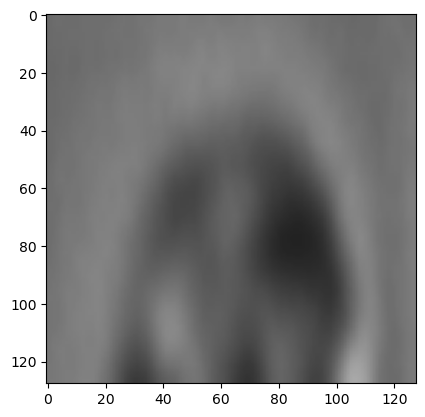

torch.Size([128, 128, 3])
0


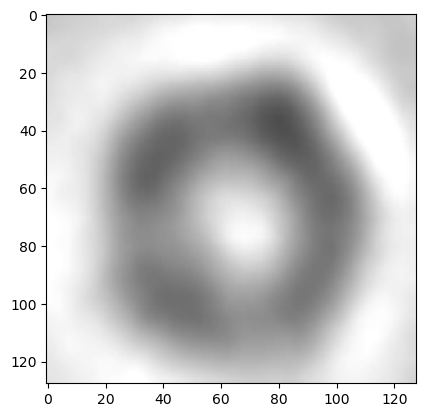

torch.Size([128, 128, 3])
0


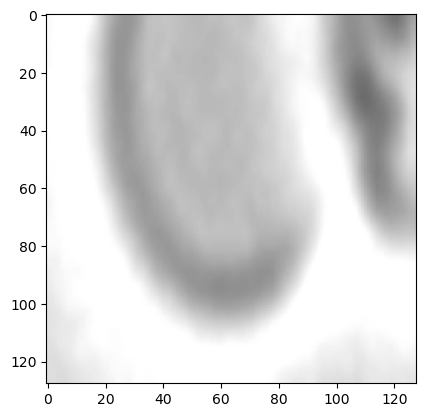

torch.Size([128, 128, 3])
0


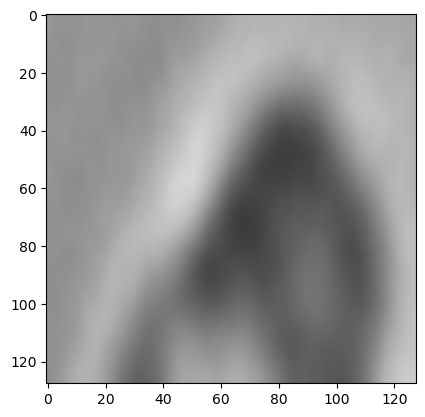

torch.Size([128, 128, 3])
0


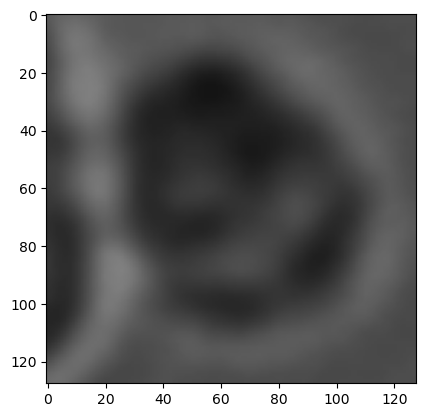

torch.Size([128, 128, 3])
0


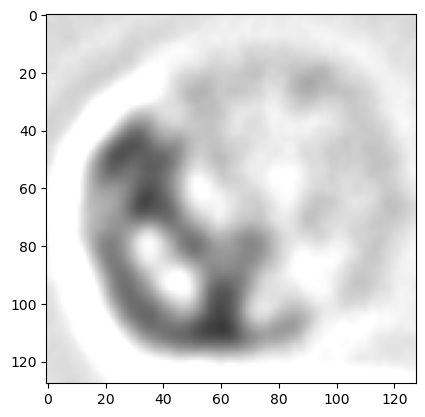

torch.Size([128, 128, 3])
0


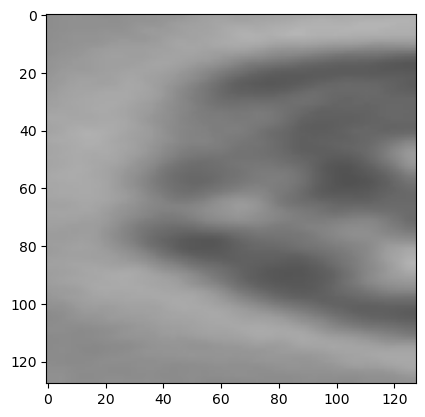

torch.Size([128, 128, 3])
1


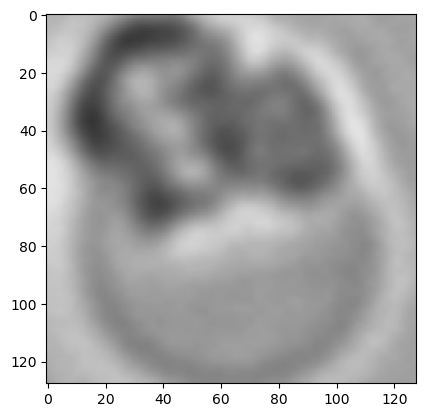

torch.Size([128, 128, 3])
1


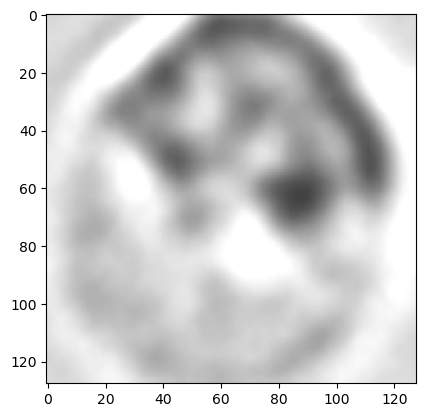

torch.Size([128, 128, 3])
0


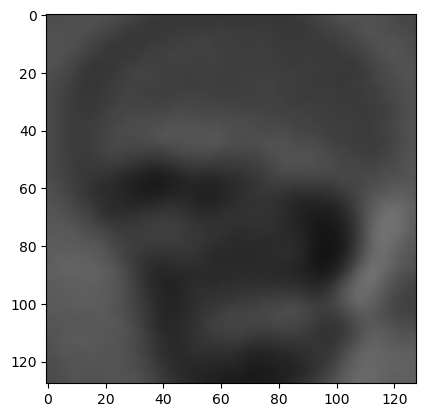

torch.Size([128, 128, 3])
1


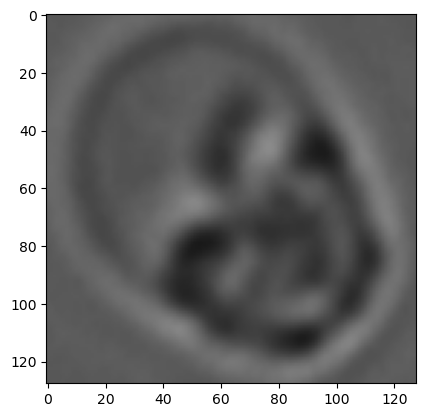

torch.Size([128, 128, 3])
0


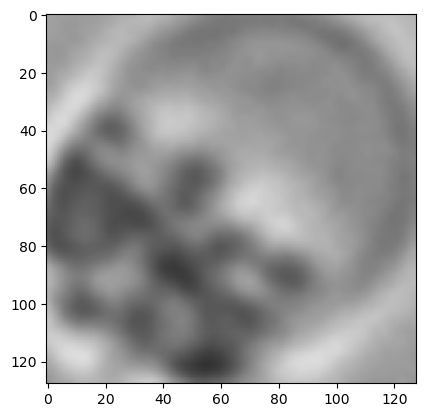

torch.Size([128, 128, 3])
1


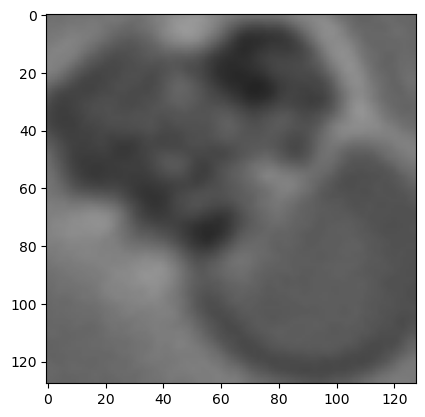

torch.Size([128, 128, 3])
1


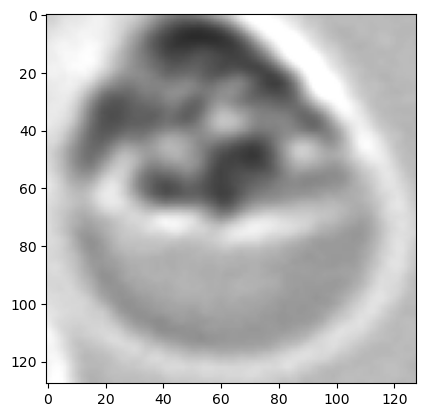

torch.Size([128, 128, 3])
1


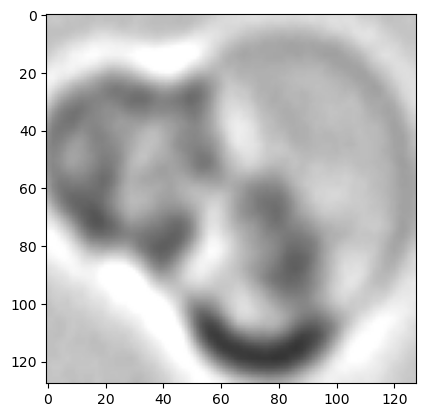

torch.Size([128, 128, 3])
0


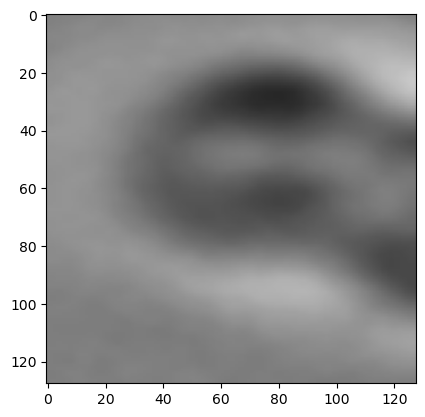

torch.Size([128, 128, 3])
1


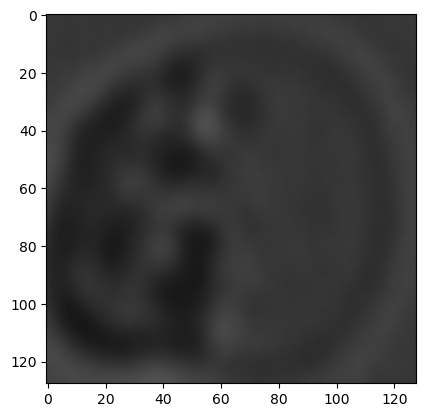

torch.Size([128, 128, 3])
0


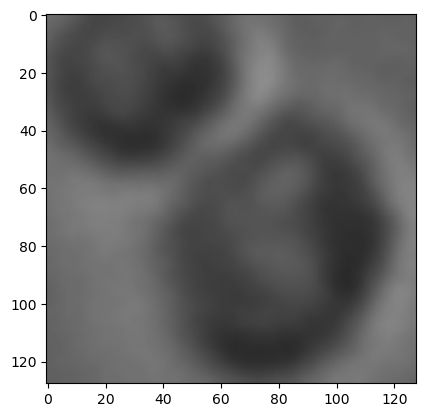

torch.Size([128, 128, 3])
0


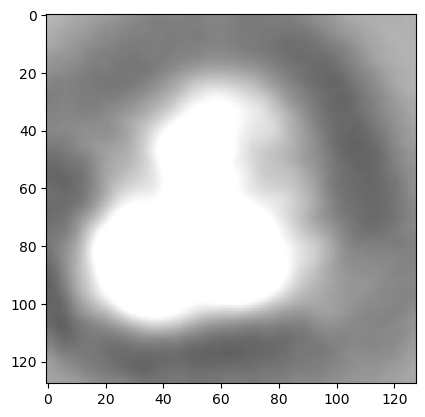

torch.Size([128, 128, 3])
0


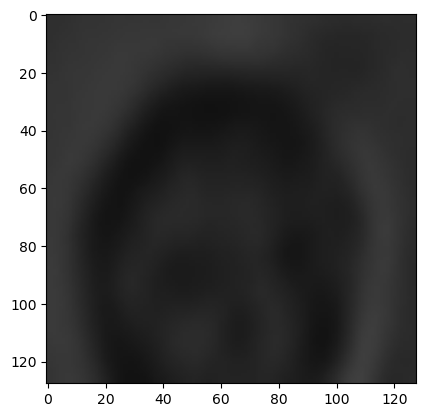

torch.Size([128, 128, 3])
0


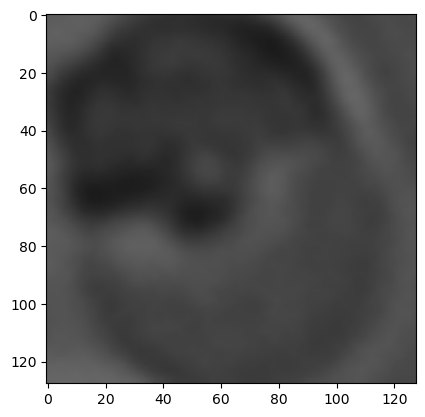

torch.Size([128, 128, 3])
1


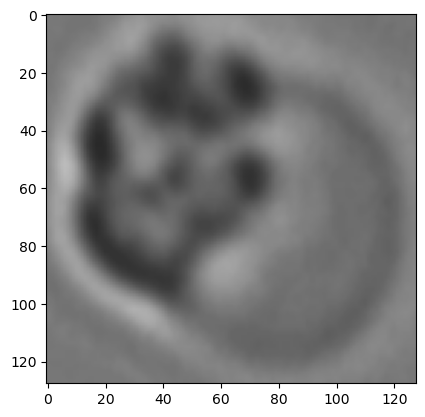

torch.Size([128, 128, 3])
0


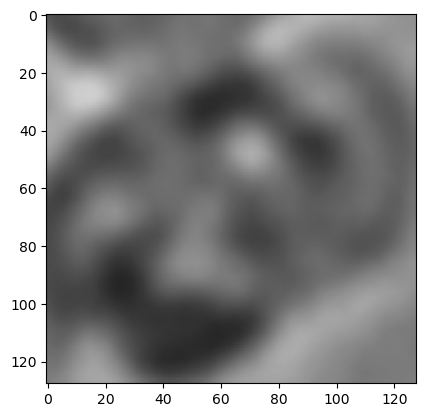

torch.Size([128, 128, 3])
1


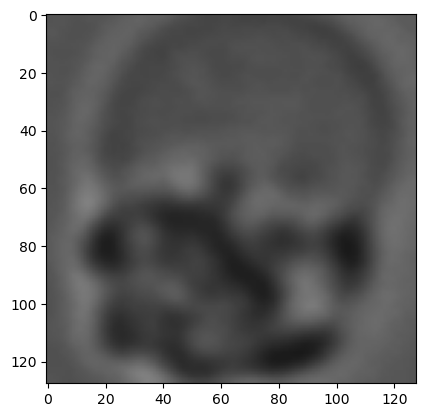

torch.Size([128, 128, 3])
0


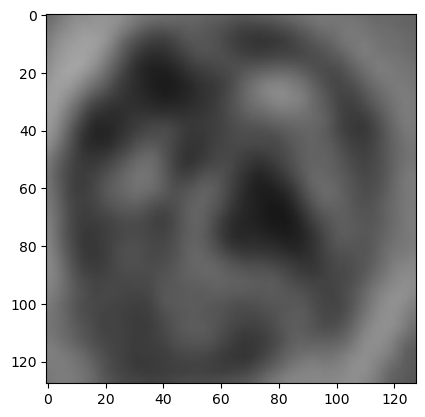

torch.Size([128, 128, 3])
0


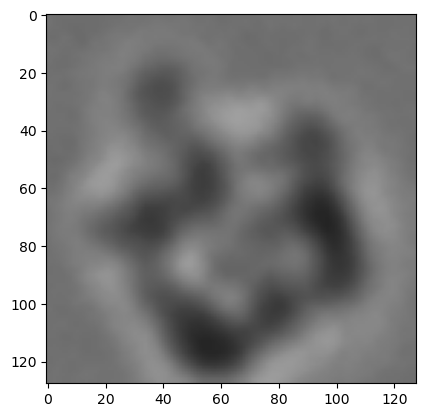

torch.Size([128, 128, 3])
1


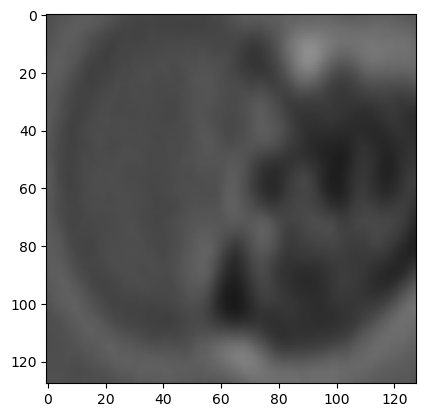

torch.Size([128, 128, 3])
0


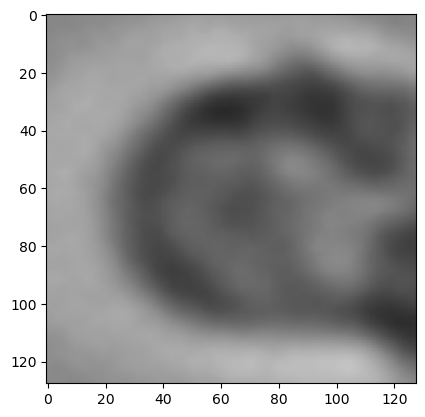

torch.Size([128, 128, 3])
1


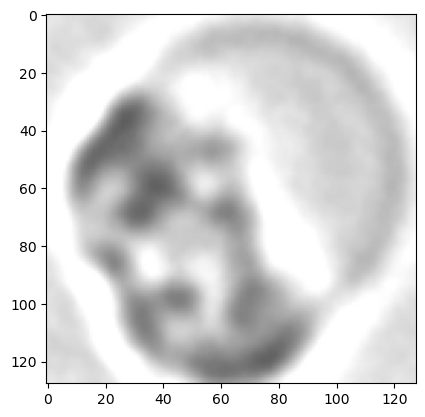

torch.Size([128, 128, 3])
0


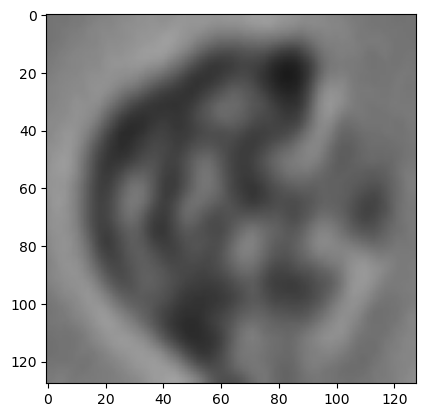

torch.Size([128, 128, 3])
0


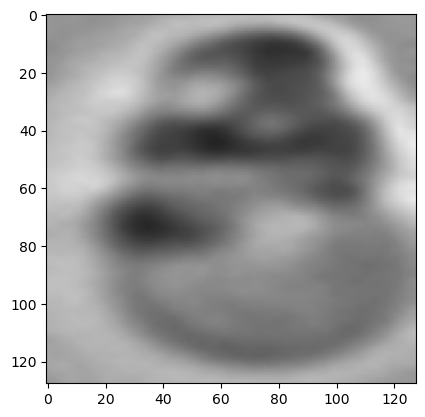

torch.Size([128, 128, 3])
0


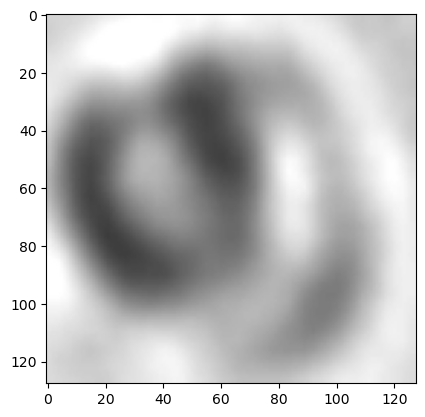

torch.Size([128, 128, 3])
0


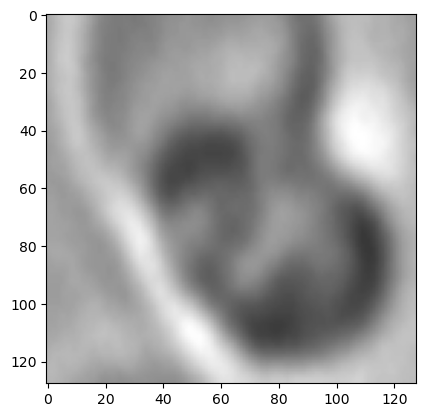

torch.Size([128, 128, 3])
1


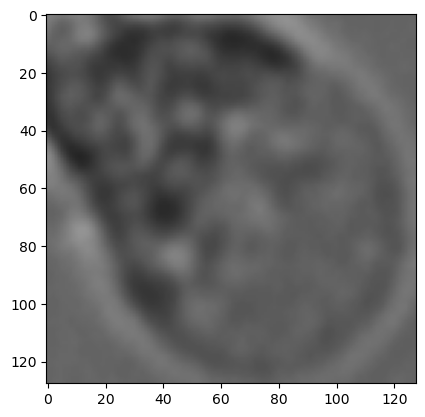

torch.Size([128, 128, 3])
0


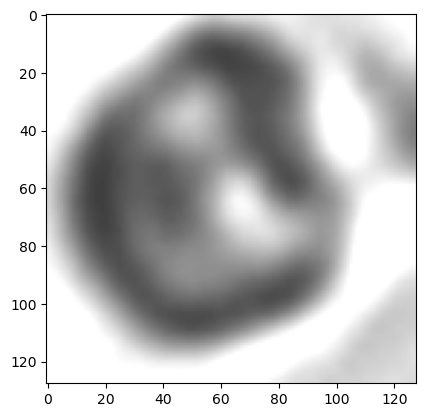

torch.Size([128, 128, 3])
0


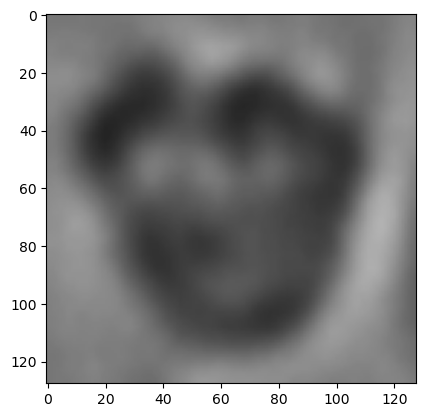

torch.Size([128, 128, 3])
1


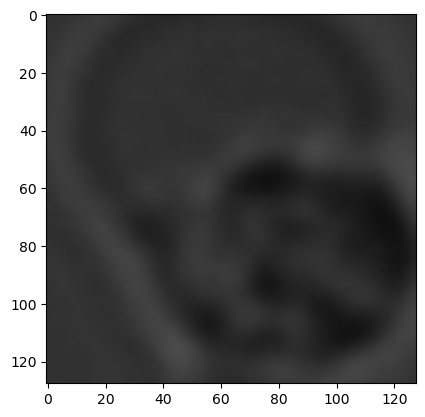

torch.Size([128, 128, 3])
0


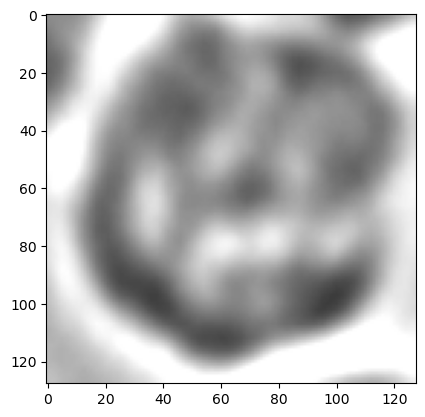

torch.Size([128, 128, 3])
1


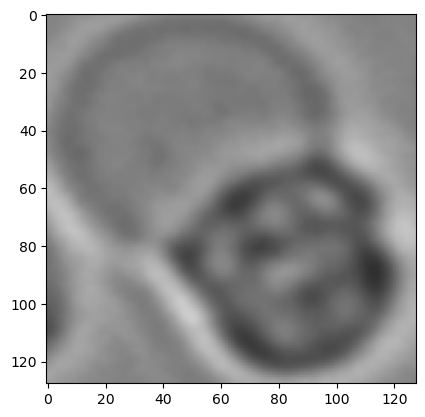

torch.Size([128, 128, 3])
0


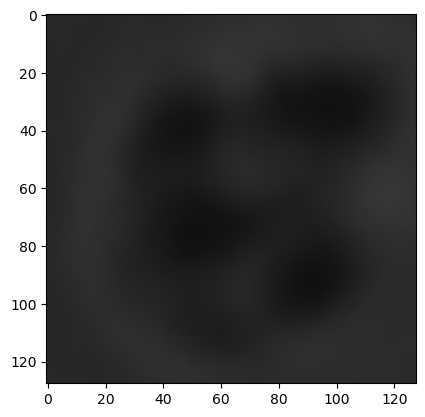

torch.Size([128, 128, 3])
0


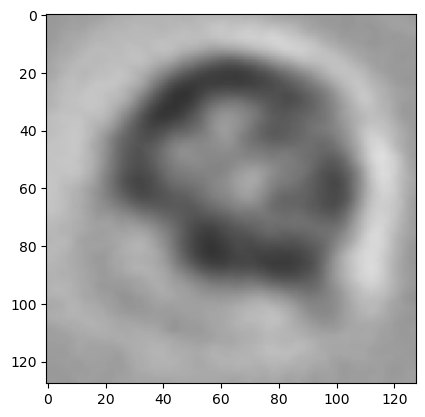

torch.Size([128, 128, 3])
0


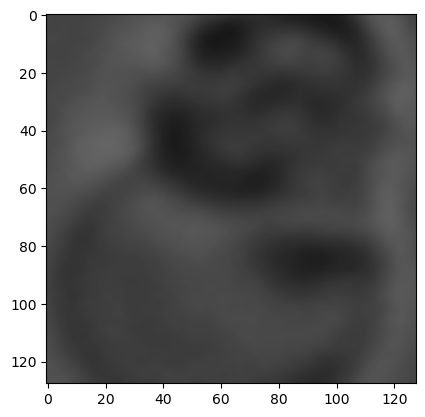

torch.Size([128, 128, 3])
0


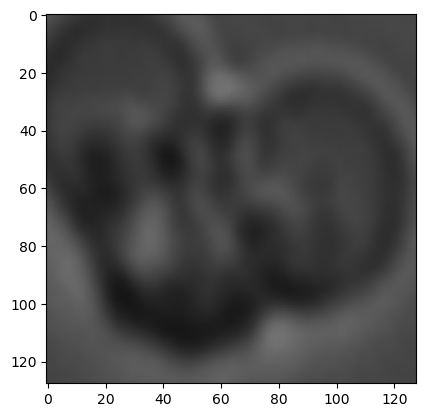

torch.Size([128, 128, 3])
0


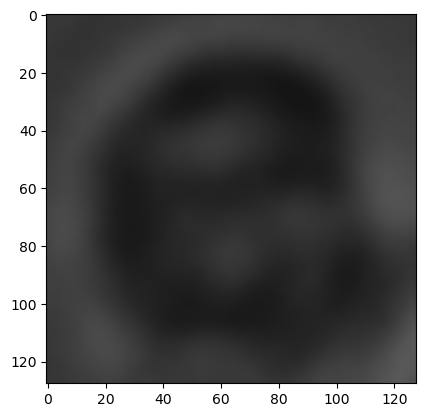

torch.Size([128, 128, 3])
0


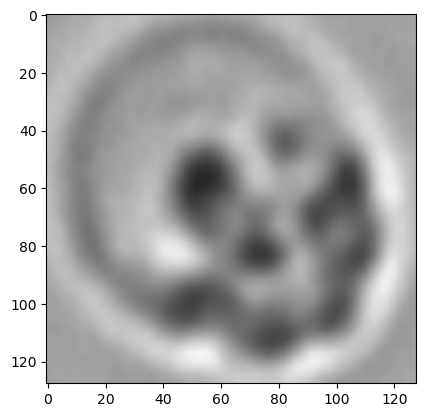

torch.Size([128, 128, 3])
1


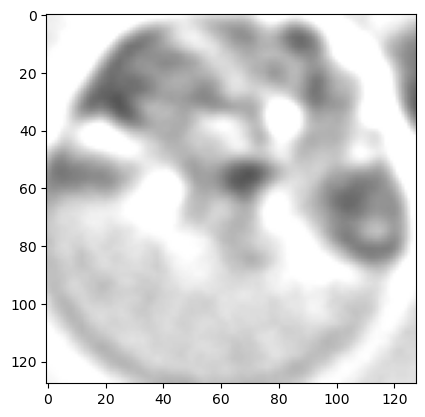

torch.Size([128, 128, 3])
0


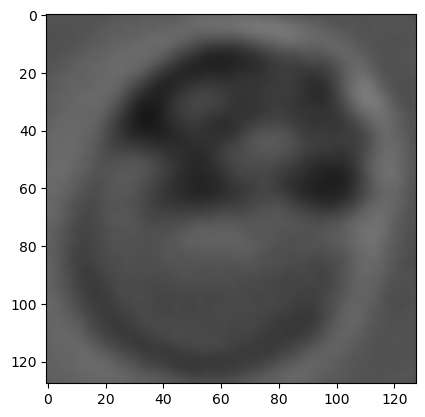

torch.Size([128, 128, 3])
0


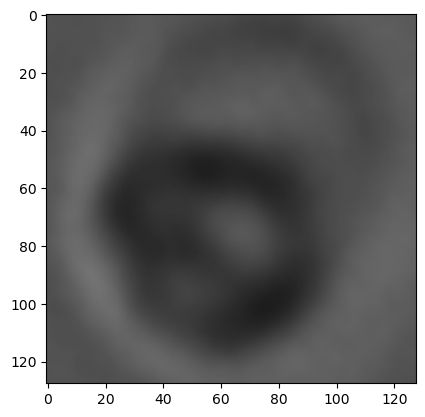

torch.Size([128, 128, 3])
1


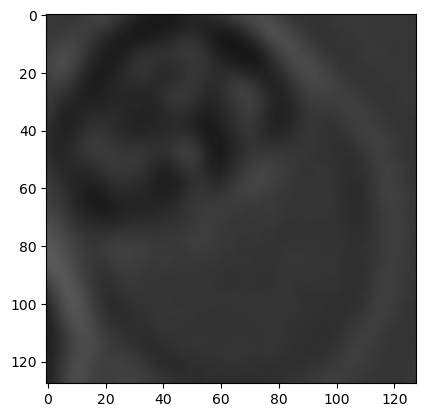

torch.Size([128, 128, 3])
0


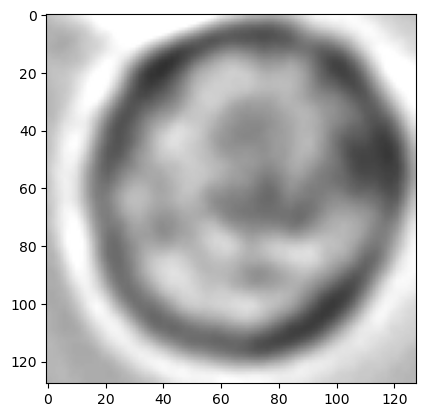

torch.Size([128, 128, 3])
0


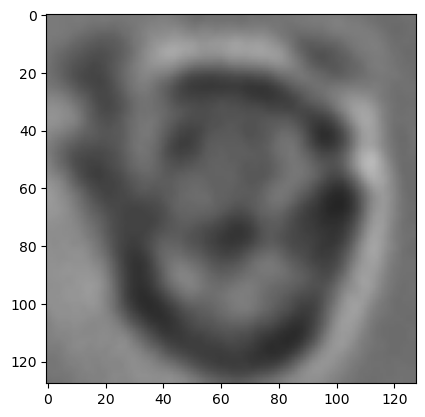

torch.Size([128, 128, 3])
0


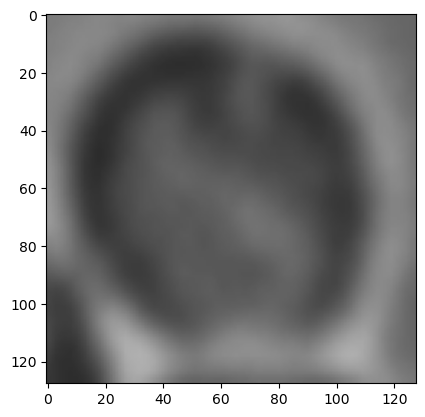

torch.Size([128, 128, 3])
0


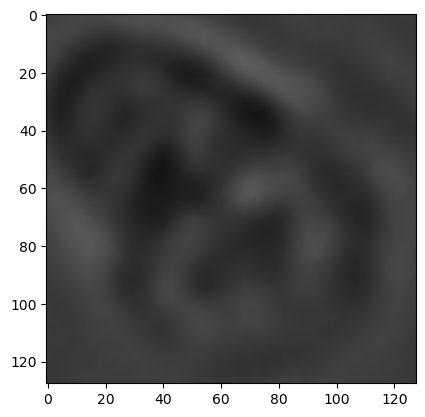

torch.Size([128, 128, 3])
0


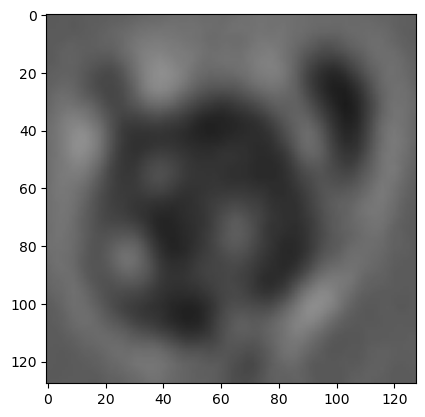

torch.Size([128, 128, 3])
1


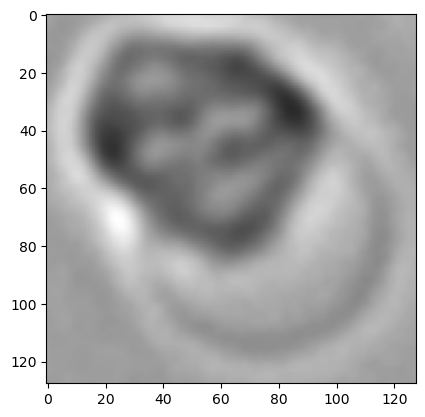

torch.Size([128, 128, 3])
0


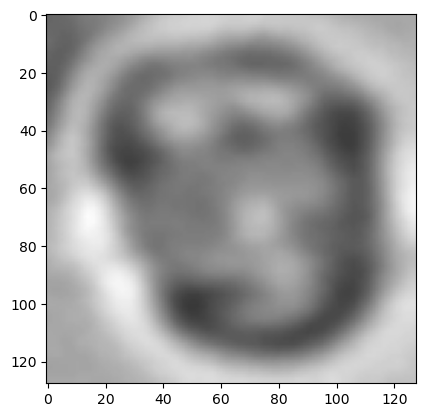

torch.Size([128, 128, 3])
1


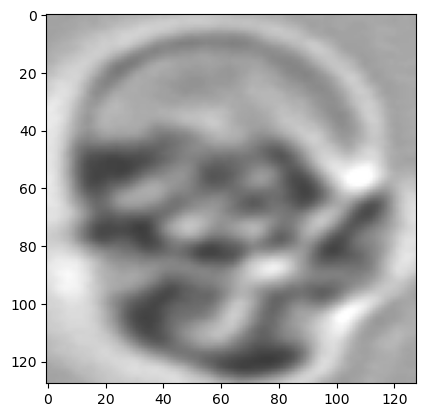

torch.Size([128, 128, 3])
0


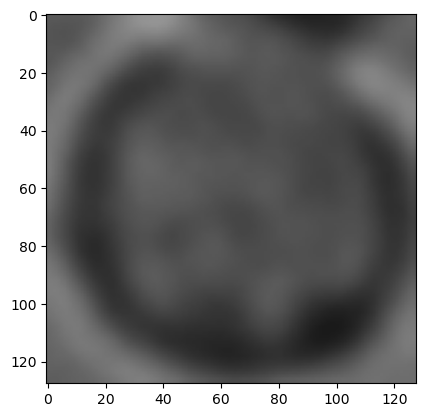

torch.Size([128, 128, 3])
0


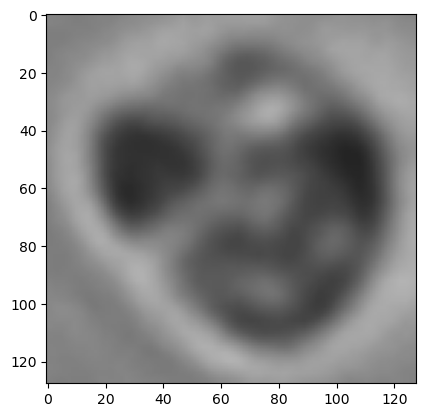

torch.Size([128, 128, 3])
0


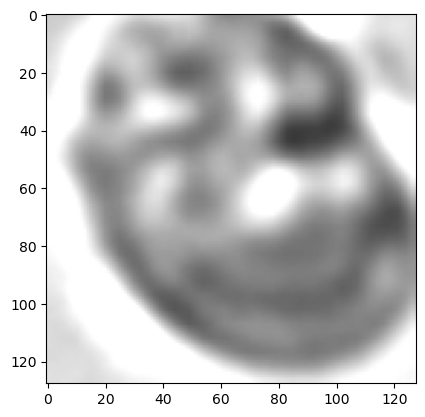

torch.Size([128, 128, 3])
1


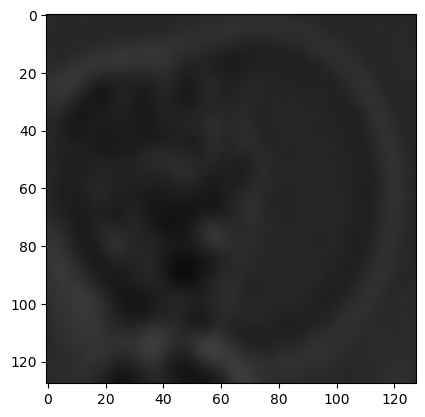

torch.Size([128, 128, 3])
0


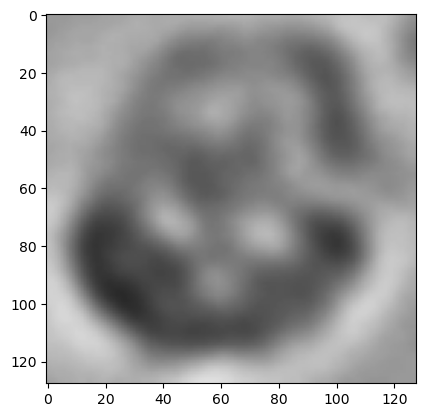

torch.Size([128, 128, 3])
1


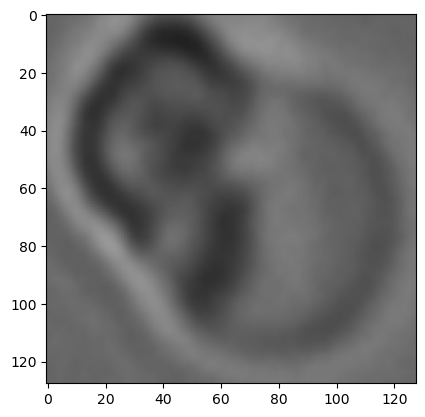

torch.Size([128, 128, 3])
1


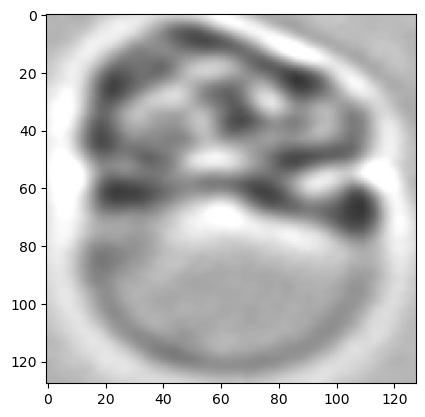

torch.Size([128, 128, 3])
1


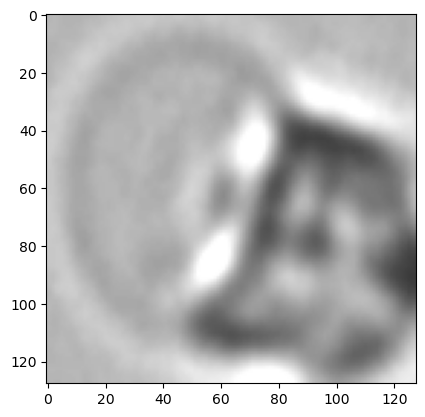

torch.Size([128, 128, 3])
0


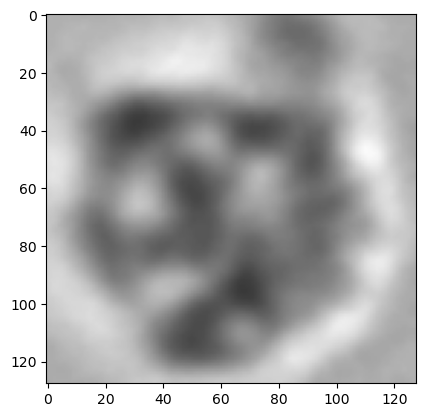

torch.Size([128, 128, 3])
0


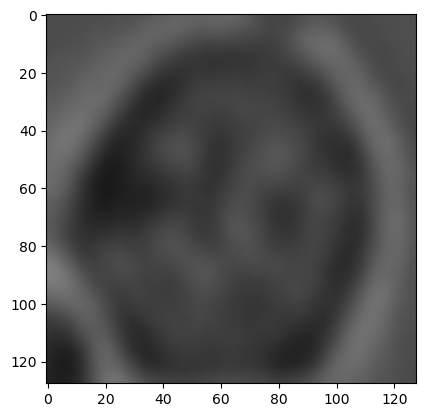

torch.Size([128, 128, 3])
0


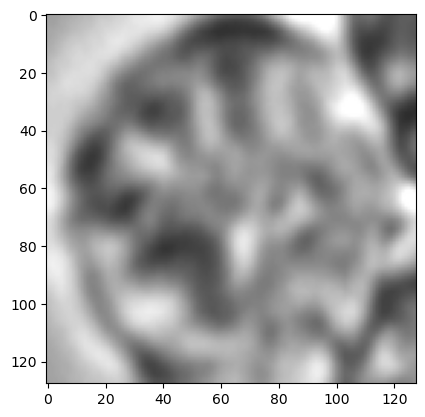

torch.Size([128, 128, 3])
1


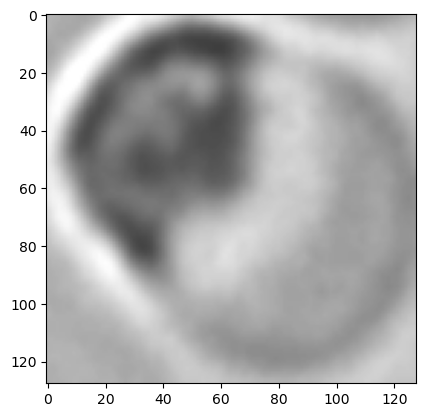

torch.Size([128, 128, 3])
0


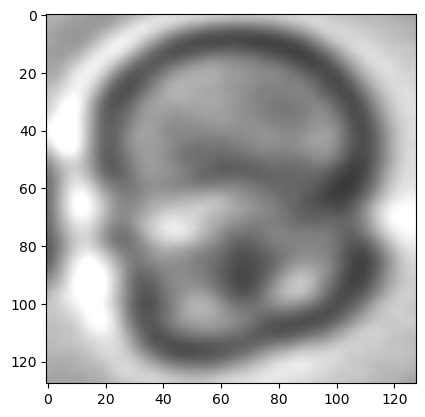

torch.Size([128, 128, 3])
0


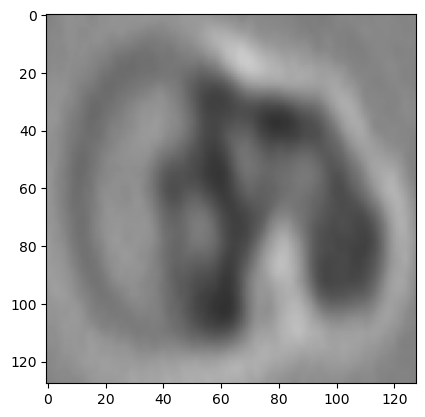

torch.Size([128, 128, 3])
0


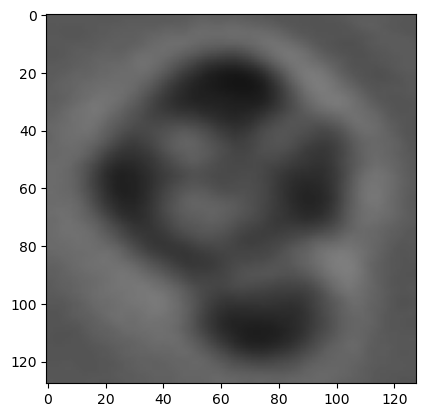

torch.Size([128, 128, 3])
0


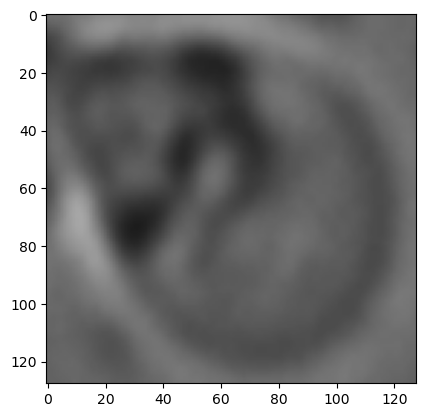

torch.Size([128, 128, 3])
0


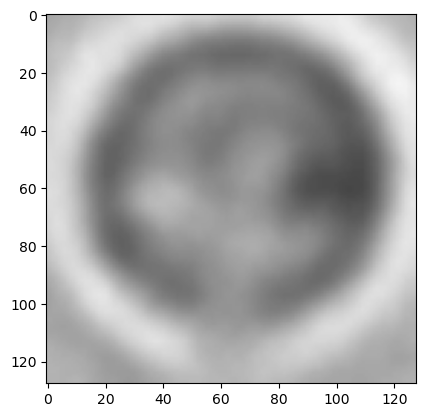

torch.Size([128, 128, 3])
0


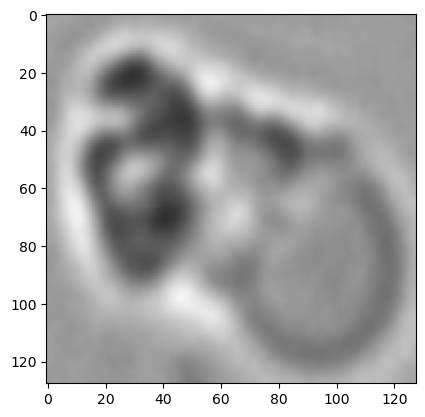

torch.Size([128, 128, 3])
1


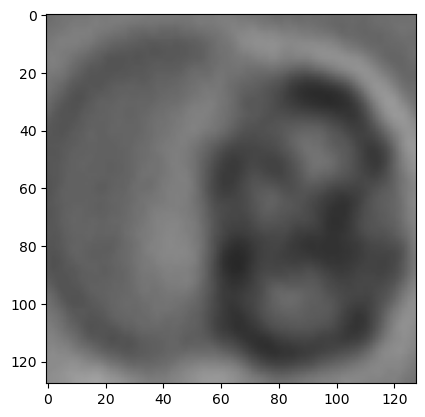

torch.Size([128, 128, 3])
0


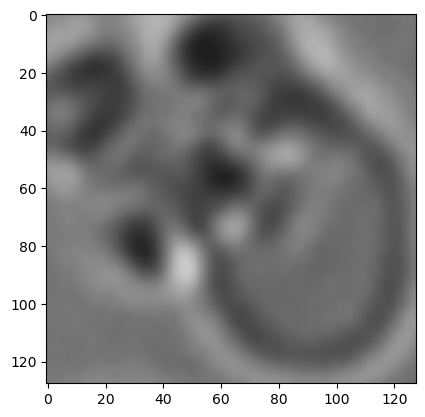

torch.Size([128, 128, 3])
1


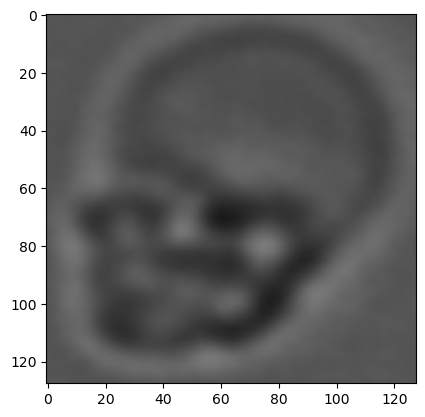

torch.Size([128, 128, 3])
0


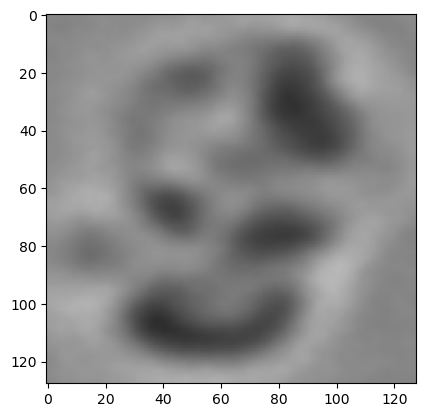

torch.Size([128, 128, 3])
0


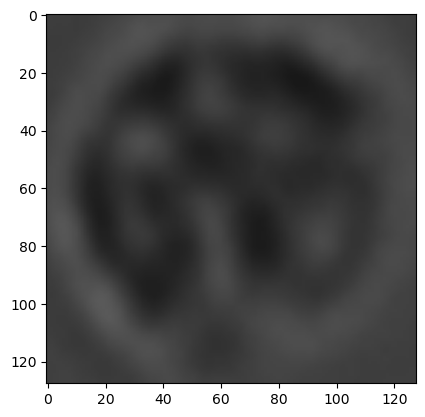

torch.Size([128, 128, 3])
0


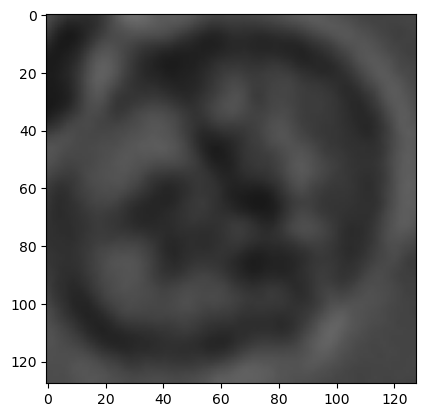

torch.Size([128, 128, 3])
0


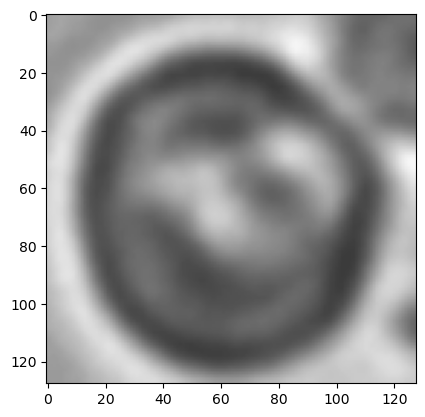

torch.Size([128, 128, 3])
0


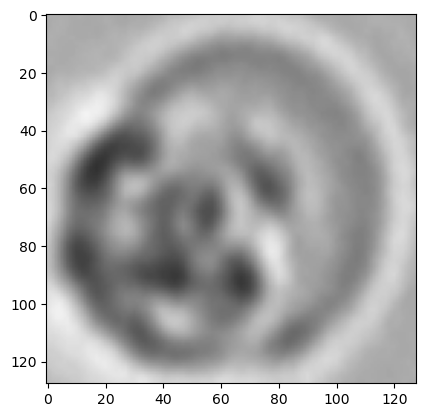

torch.Size([128, 128, 3])
0


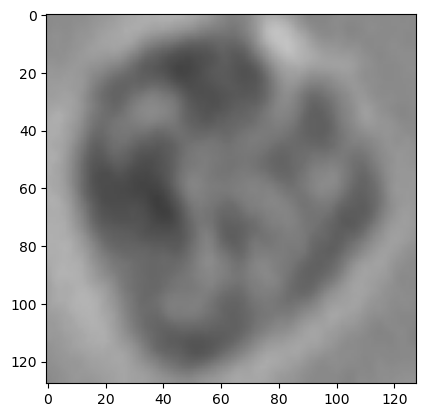

torch.Size([128, 128, 3])
0


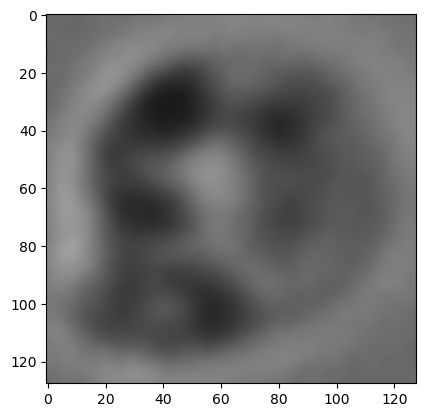

torch.Size([128, 128, 3])
0


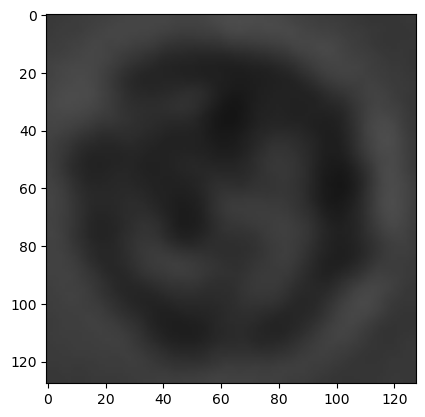

torch.Size([128, 128, 3])
1


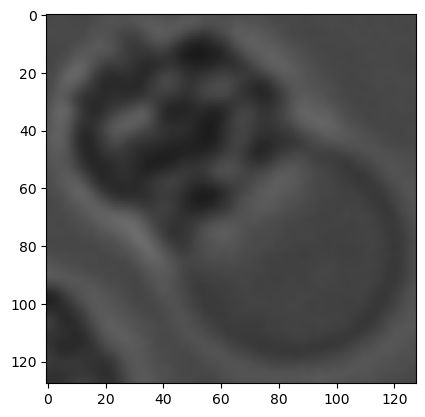

torch.Size([128, 128, 3])
0


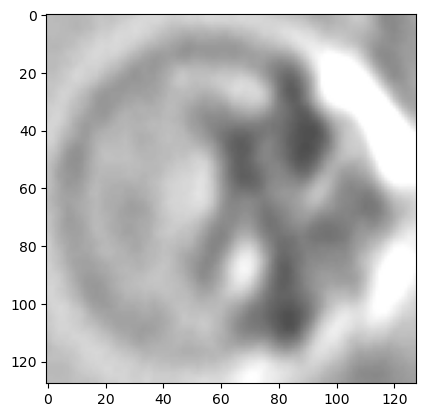

torch.Size([128, 128, 3])
0


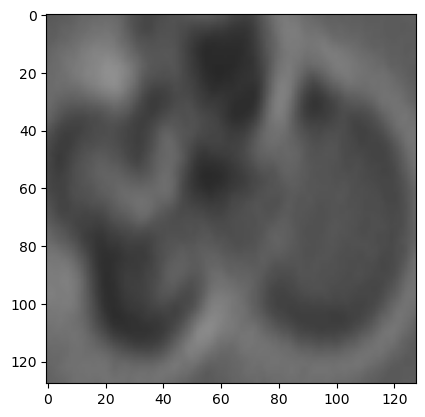

torch.Size([128, 128, 3])
0


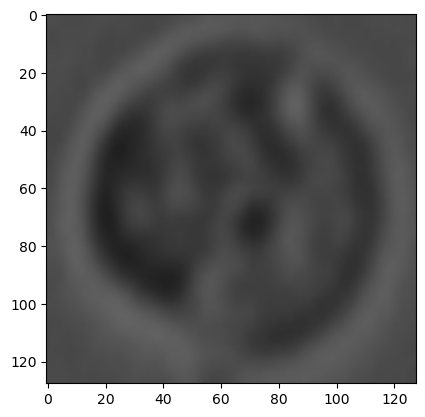

torch.Size([128, 128, 3])
0


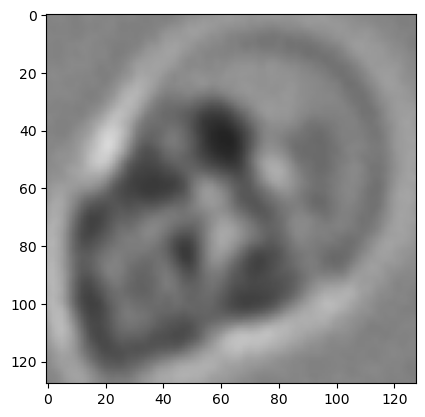

torch.Size([128, 128, 3])
1


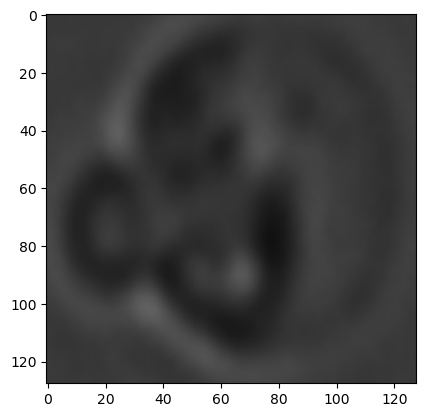

torch.Size([128, 128, 3])
0


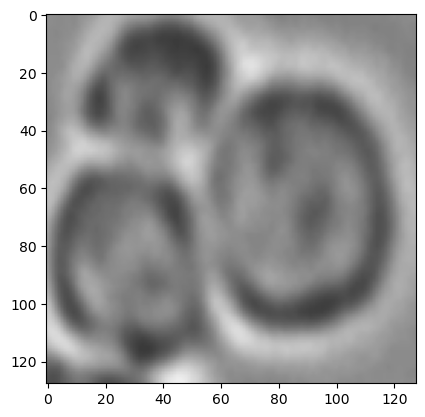

torch.Size([128, 128, 3])
1


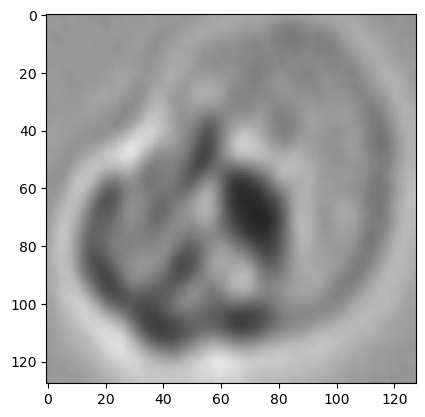

torch.Size([128, 128, 3])
0


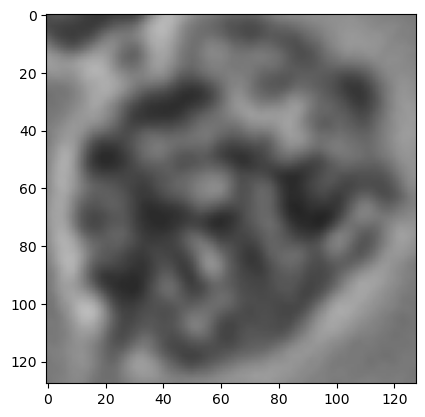

torch.Size([128, 128, 3])
0


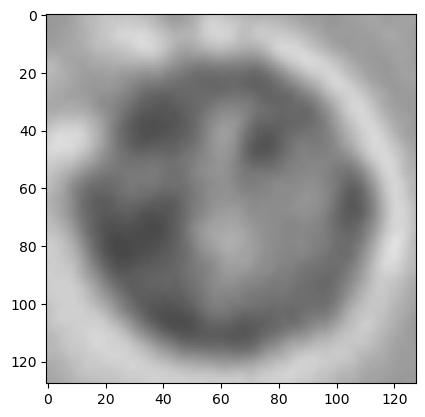

torch.Size([128, 128, 3])
0


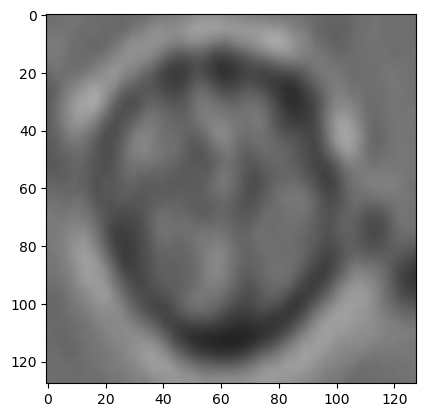

torch.Size([128, 128, 3])
0


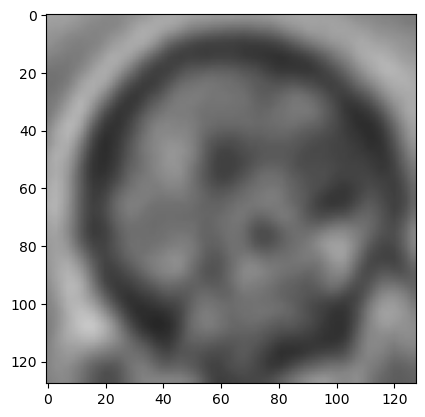

torch.Size([128, 128, 3])
0


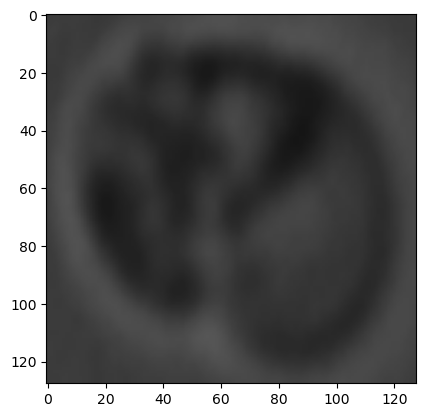

torch.Size([128, 128, 3])
0


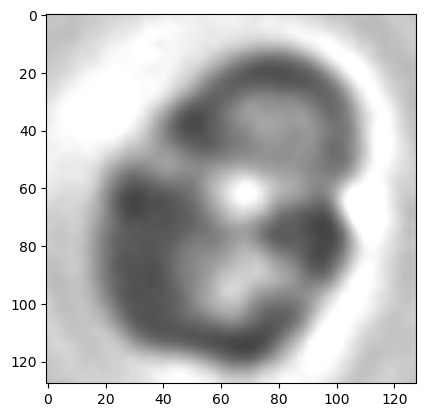

torch.Size([128, 128, 3])
0


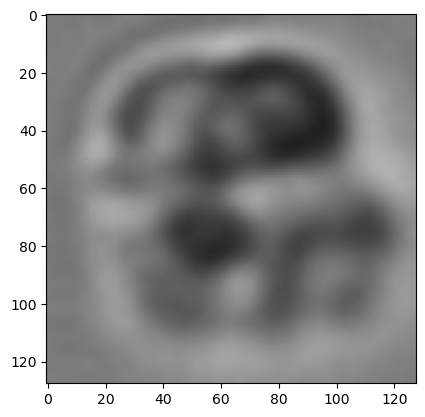

torch.Size([128, 128, 3])
1


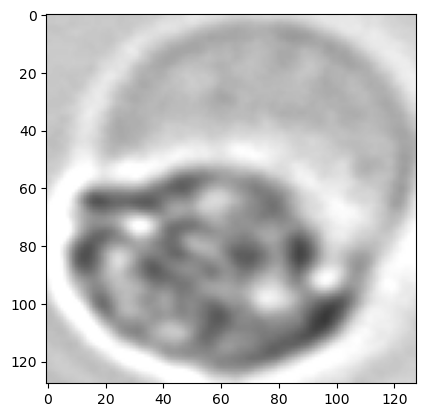

torch.Size([128, 128, 3])
0


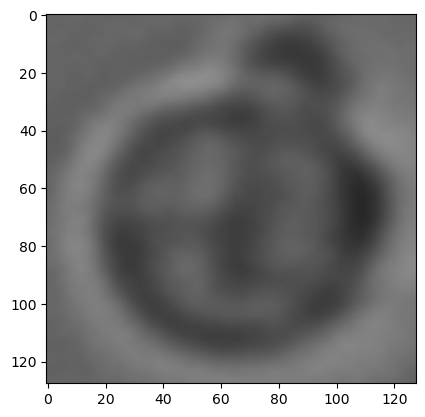

torch.Size([128, 128, 3])
0


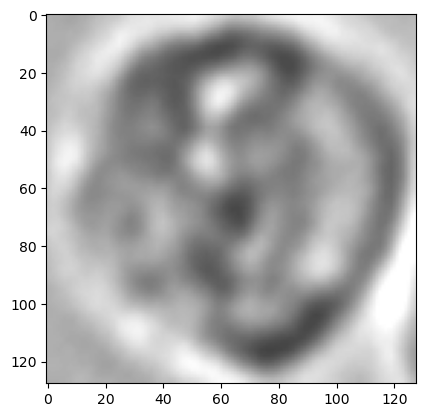

torch.Size([128, 128, 3])
0


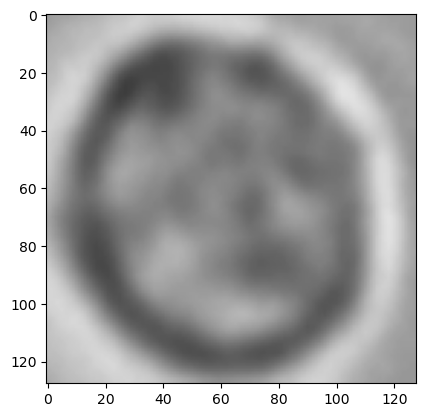

torch.Size([128, 128, 3])
0


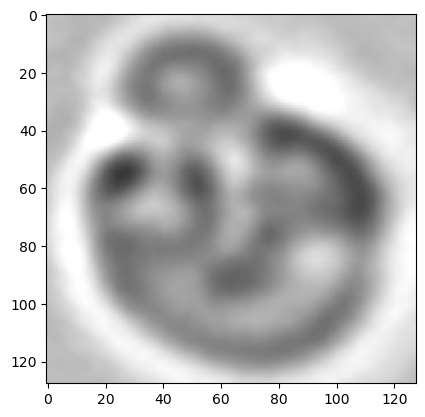

torch.Size([128, 128, 3])
0


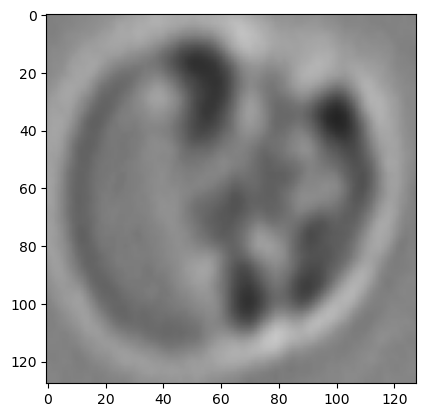

torch.Size([128, 128, 3])
0


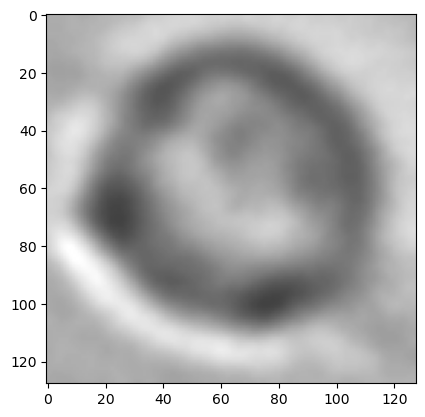

torch.Size([128, 128, 3])
0


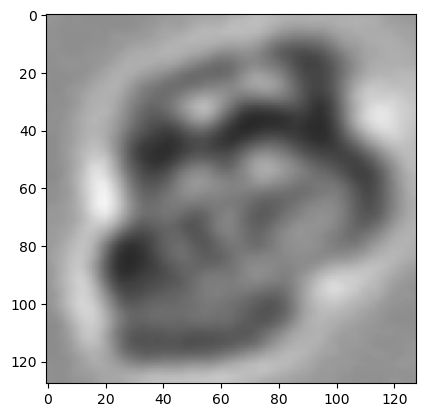

torch.Size([128, 128, 3])
0


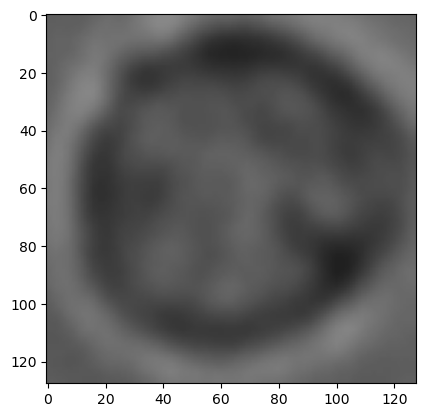

torch.Size([128, 128, 3])
0


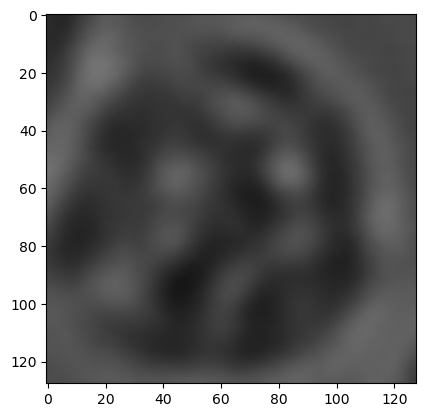

torch.Size([128, 128, 3])
0


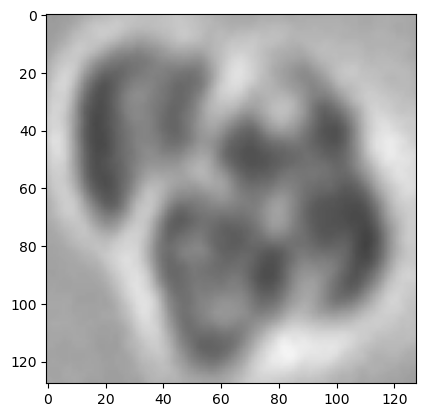

torch.Size([128, 128, 3])
1


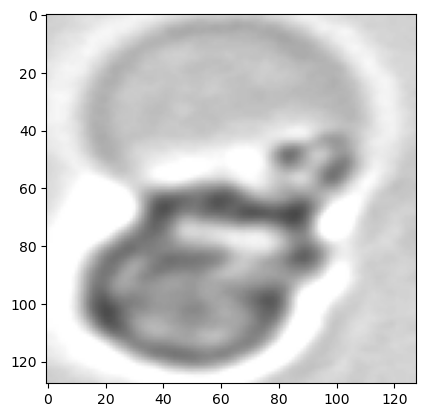

torch.Size([128, 128, 3])
0


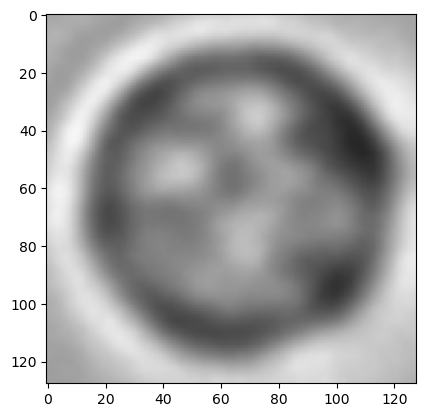

torch.Size([128, 128, 3])
0


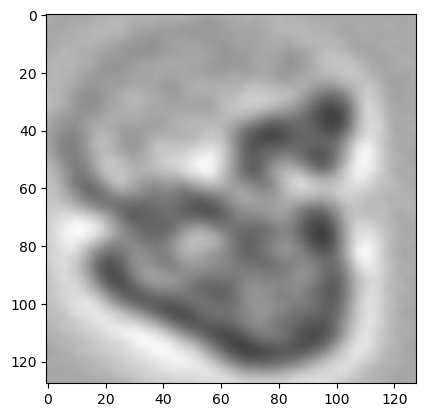

torch.Size([128, 128, 3])
1


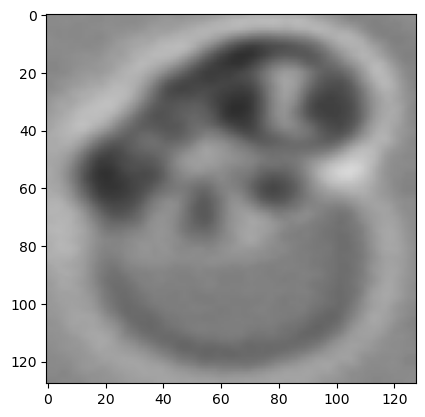

torch.Size([128, 128, 3])
0


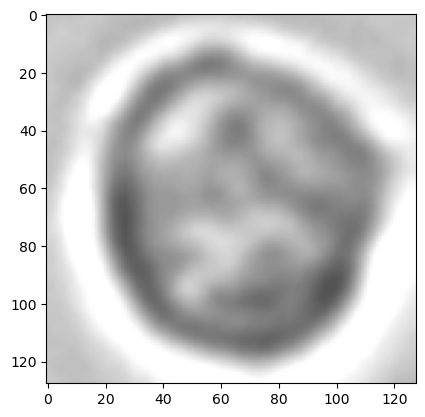

torch.Size([128, 128, 3])
1


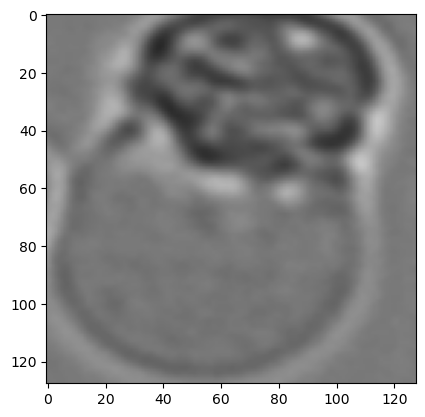

torch.Size([128, 128, 3])
0


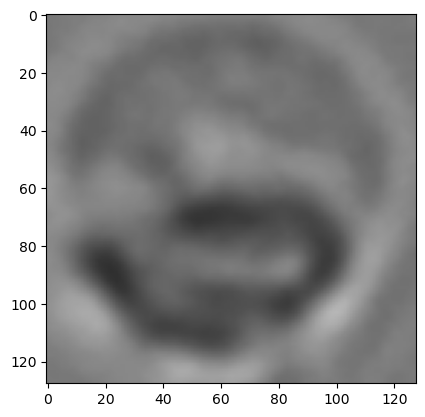

torch.Size([128, 128, 3])
0


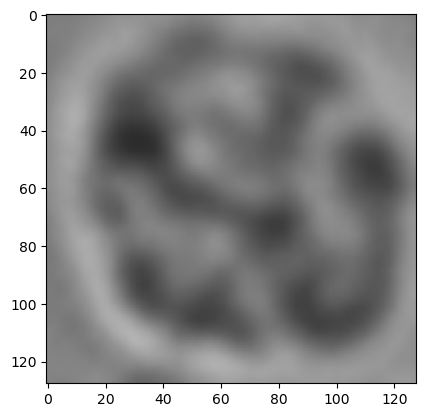

torch.Size([128, 128, 3])
0


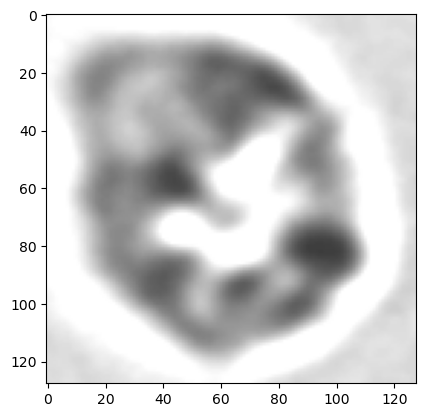

torch.Size([128, 128, 3])
0


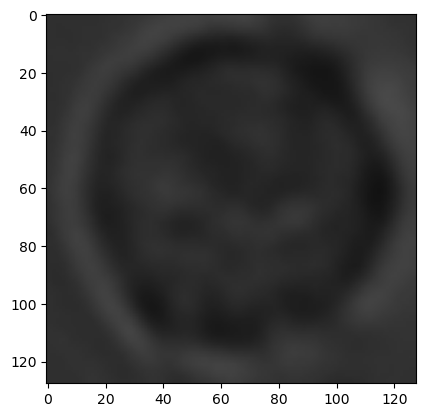

torch.Size([128, 128, 3])
0


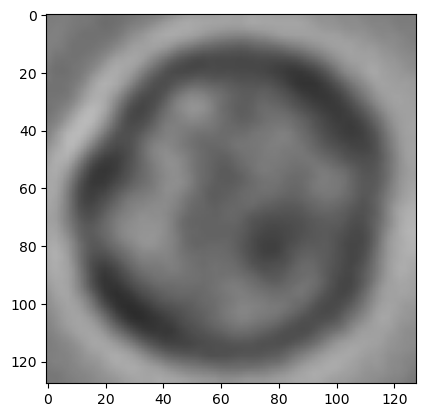

torch.Size([128, 128, 3])
0


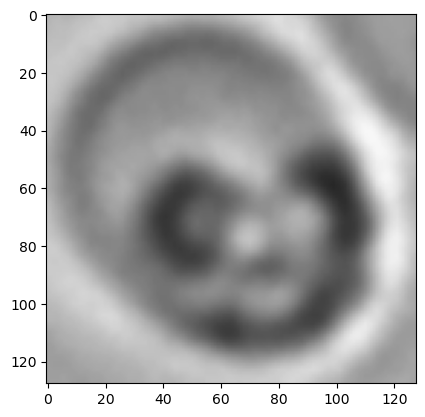

torch.Size([128, 128, 3])
1


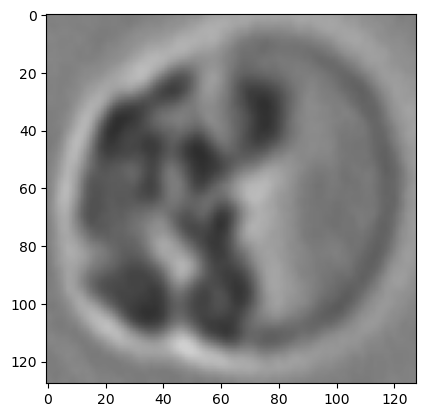

torch.Size([128, 128, 3])
0


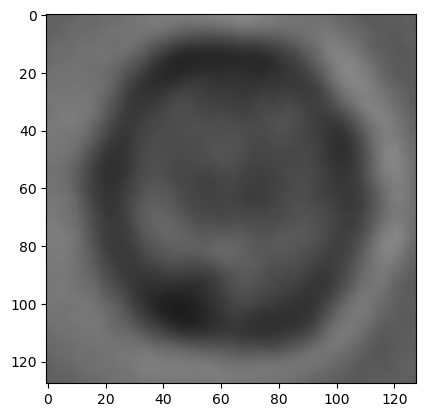

torch.Size([128, 128, 3])
0


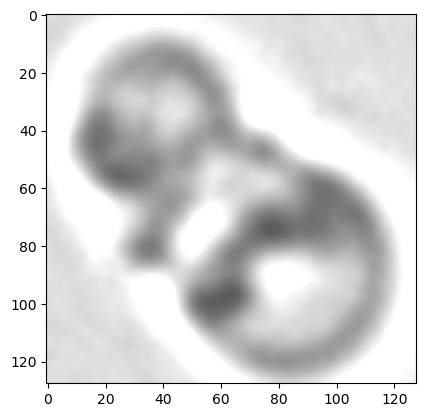

torch.Size([128, 128, 3])
0


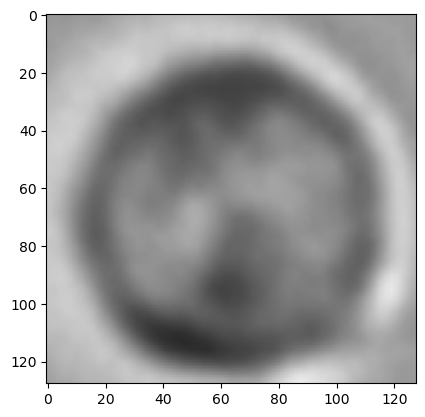

torch.Size([128, 128, 3])
0


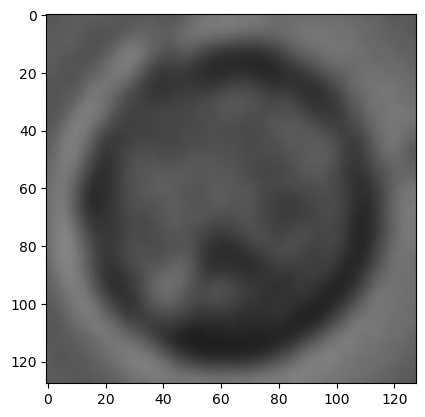

torch.Size([128, 128, 3])
0


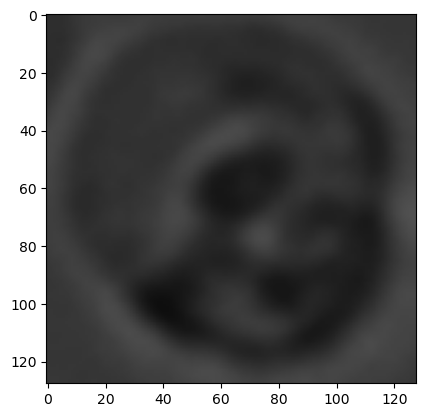

torch.Size([128, 128, 3])
0


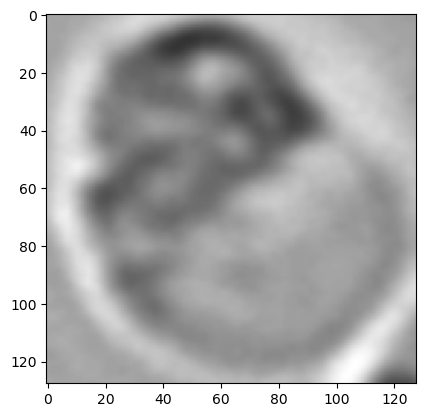

torch.Size([128, 128, 3])
1


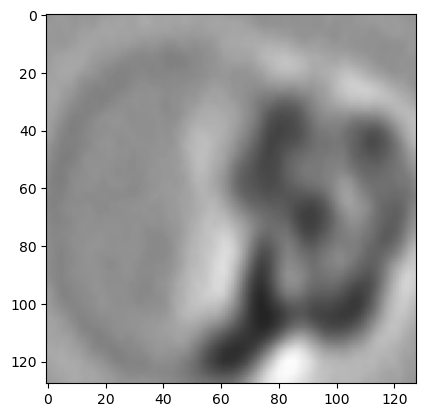

torch.Size([128, 128, 3])
0


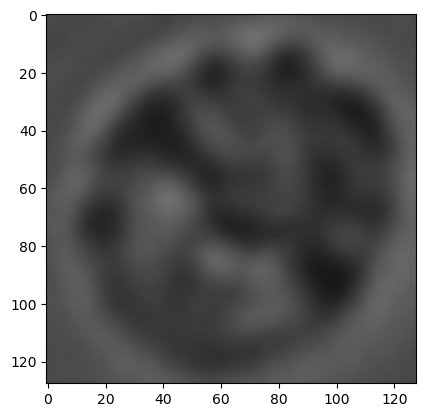

torch.Size([128, 128, 3])
1


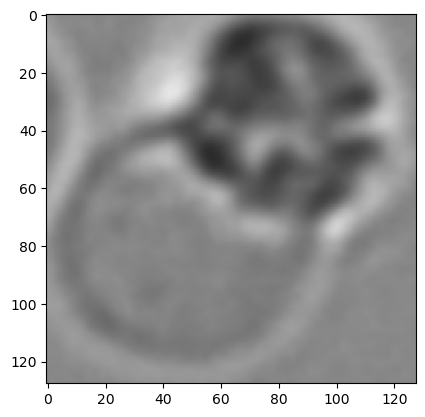

torch.Size([128, 128, 3])
0


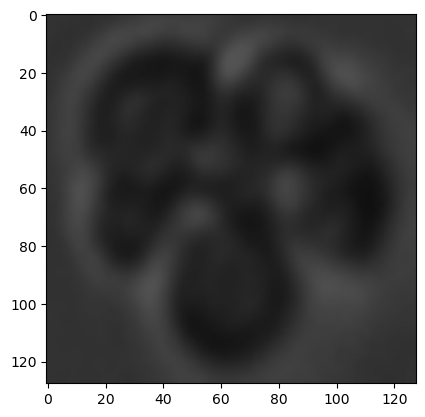

torch.Size([128, 128, 3])
0


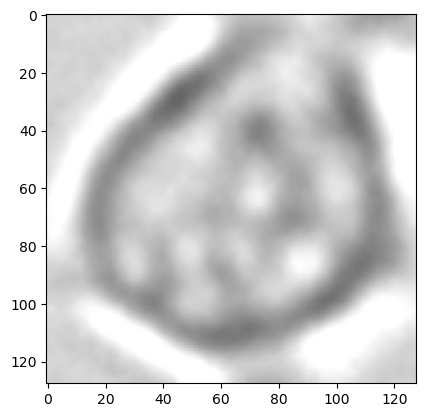

torch.Size([128, 128, 3])
0


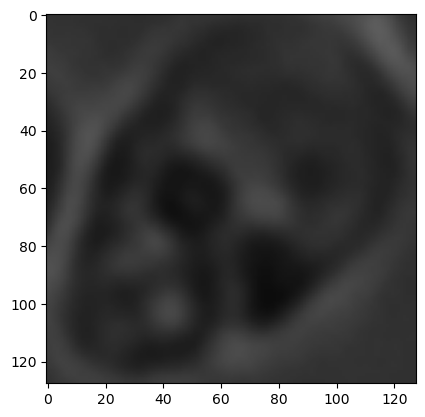

torch.Size([128, 128, 3])
0


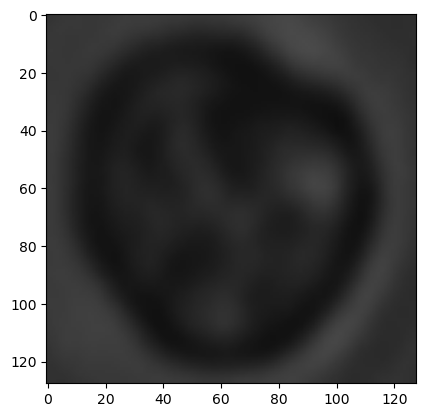

torch.Size([128, 128, 3])
0


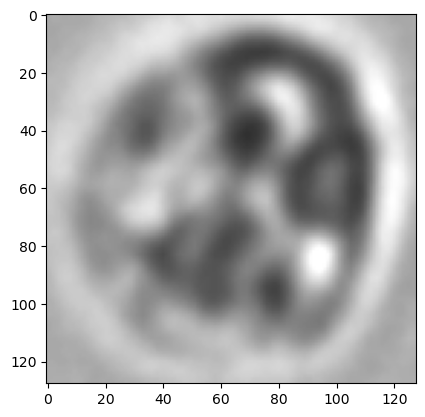

torch.Size([128, 128, 3])
0


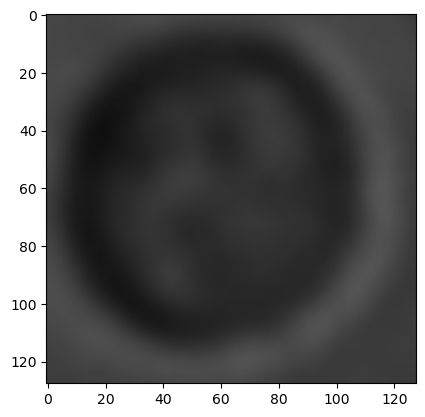

torch.Size([128, 128, 3])
0


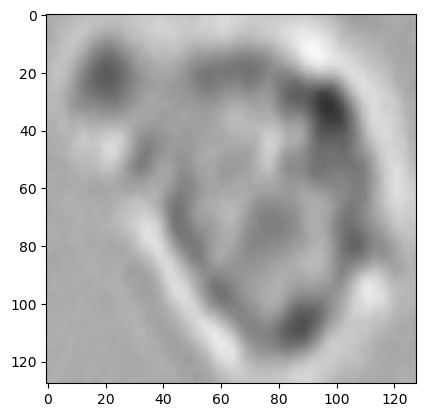

torch.Size([128, 128, 3])
0


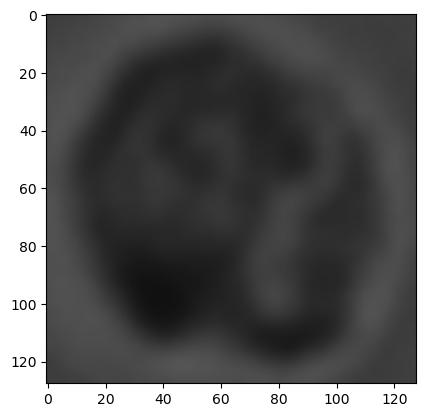

torch.Size([128, 128, 3])
0


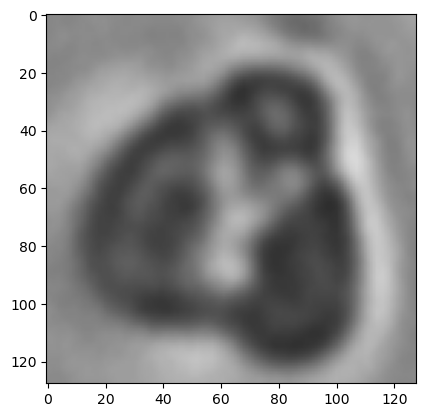

torch.Size([128, 128, 3])
0


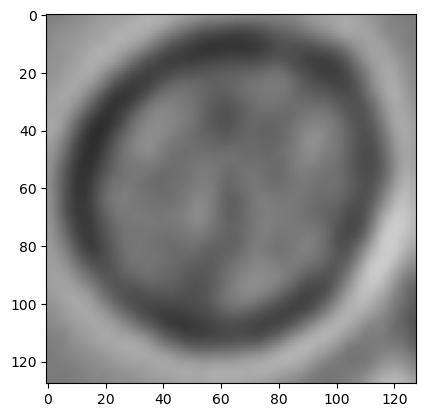

torch.Size([128, 128, 3])
0


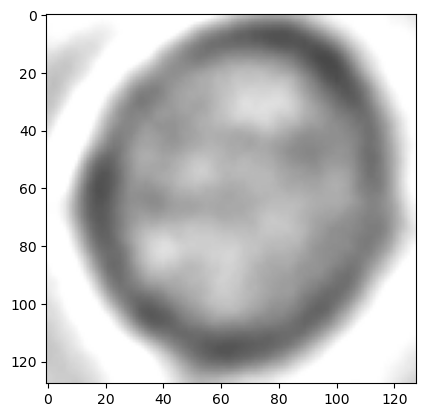

torch.Size([128, 128, 3])
0


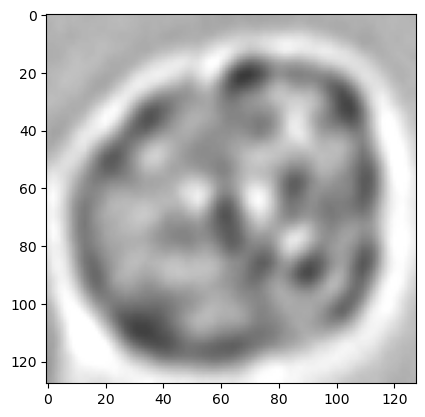

torch.Size([128, 128, 3])
0


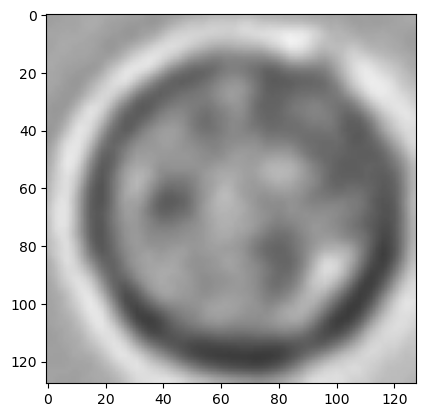

torch.Size([128, 128, 3])
0


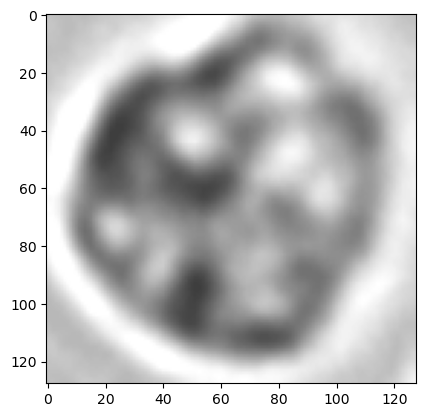

torch.Size([128, 128, 3])
0


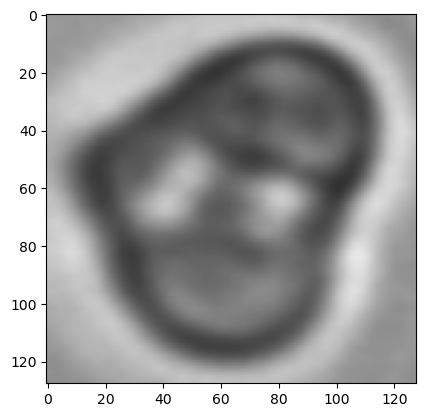

torch.Size([128, 128, 3])
0


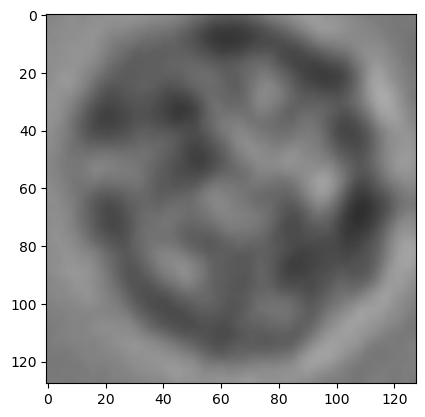

torch.Size([128, 128, 3])
1


KeyboardInterrupt: 

In [15]:
for val in data :
    x,y = val
    x = x.transpose(0,1).transpose(1,2)
    print(x.shape)
    print(y)
    plt.imshow(x)
    plt.show()
   

In [2]:
import argparse
import os
import sys
from pathlib import Path
import pandas as pd
import cv2
import torch
import matplotlib


import torch.backends.cudnn as cudnn
from dataset import  pred2dataset

from tqdm import tqdm

from resnet import resnet18, resnet34, resnet50, resnet101
import  os
import  matplotlib.pyplot as plt
import numpy as np
# 识别模型初始化


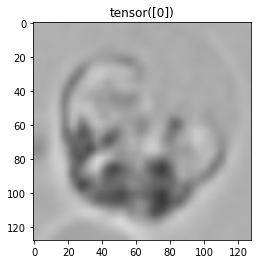

tensor([0])


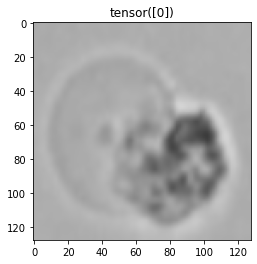

tensor([0])


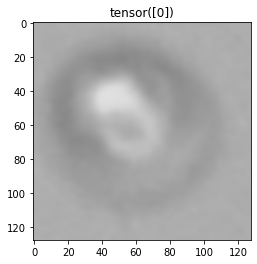

tensor([0])


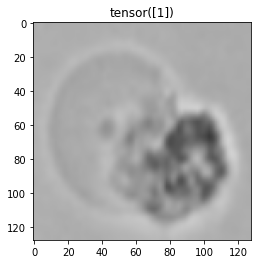

tensor([1])


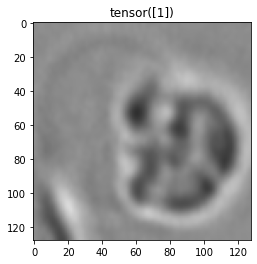

tensor([1])


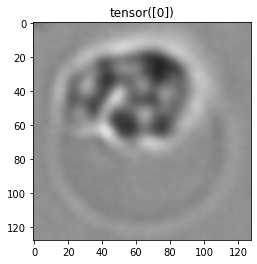

tensor([0])


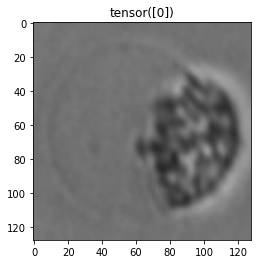

tensor([0])


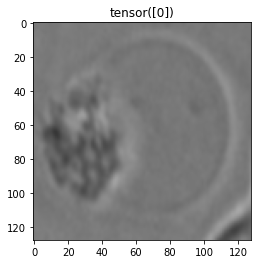

tensor([0])


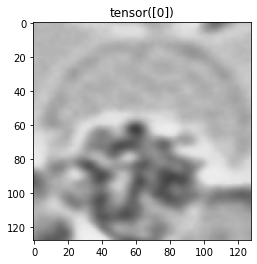

tensor([0])


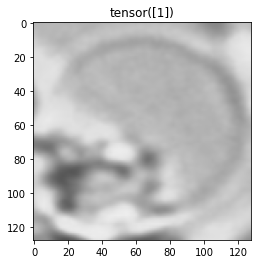

tensor([1])


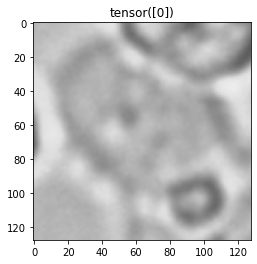

tensor([0])


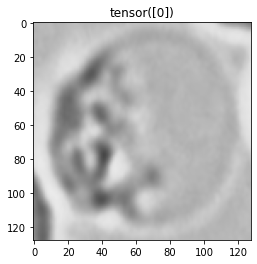

tensor([0])


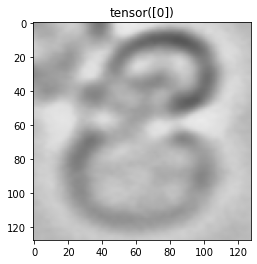

tensor([0])


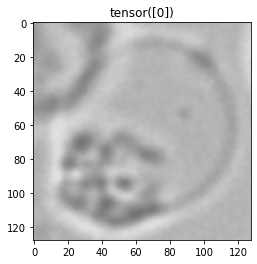

tensor([0])


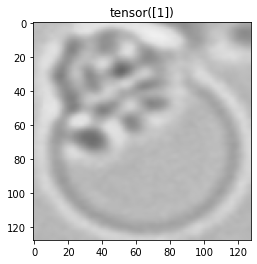

tensor([1])


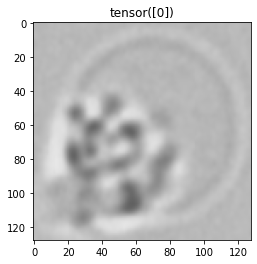

tensor([0])


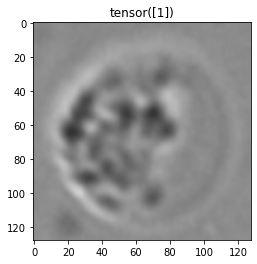

tensor([1])


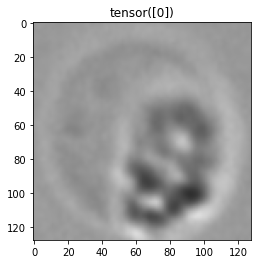

tensor([0])


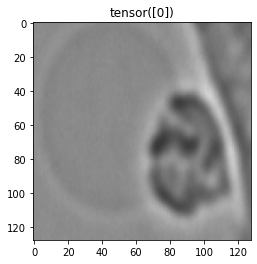

tensor([0])


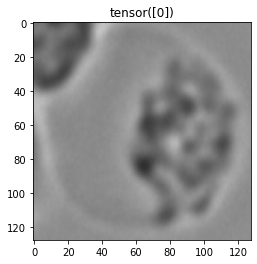

tensor([0])


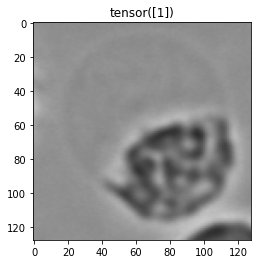

tensor([1])


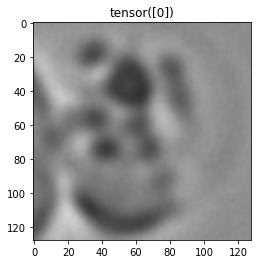

tensor([0])


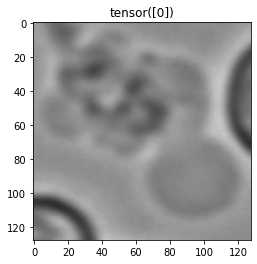

tensor([0])


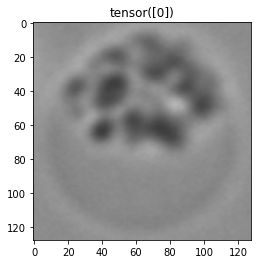

tensor([0])


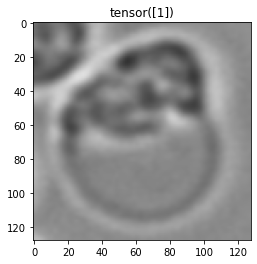

tensor([1])


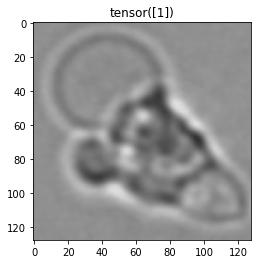

tensor([1])


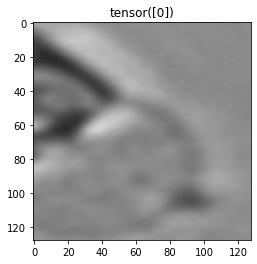

tensor([0])


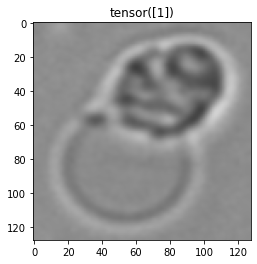

tensor([1])


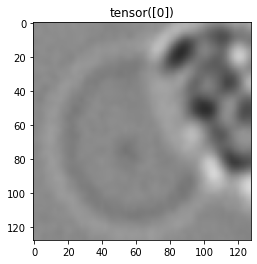

tensor([0])


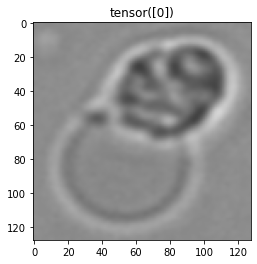

tensor([0])


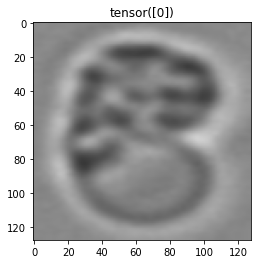

tensor([0])


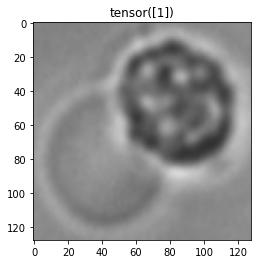

tensor([1])


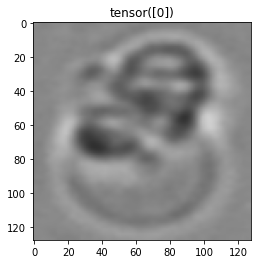

tensor([0])


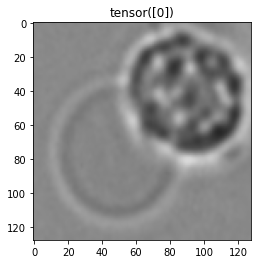

tensor([0])


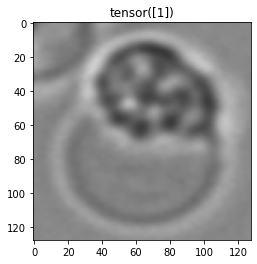

tensor([1])


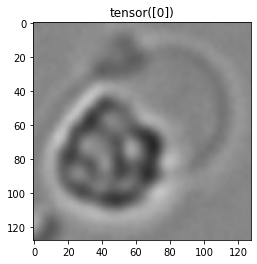

tensor([0])


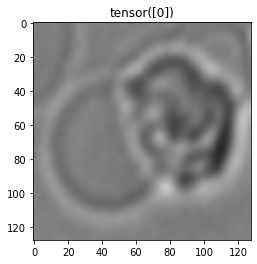

tensor([0])


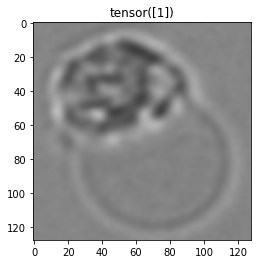

tensor([1])


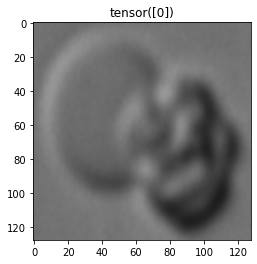

tensor([0])


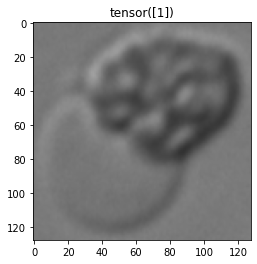

tensor([1])


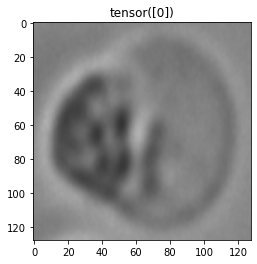

tensor([0])


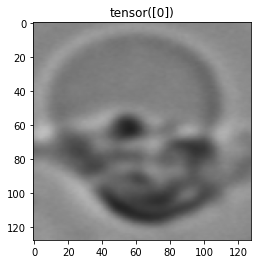

tensor([0])


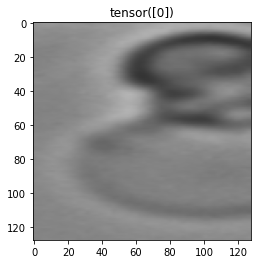

tensor([0])


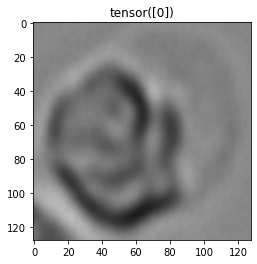

tensor([0])


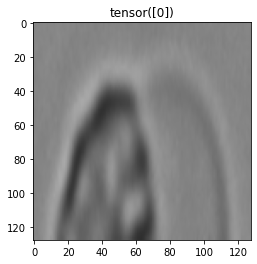

tensor([0])


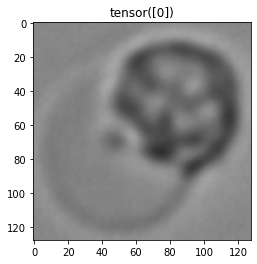

tensor([0])


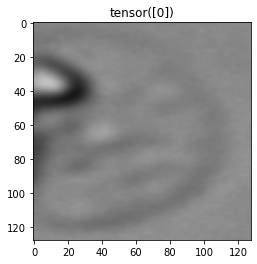

tensor([0])


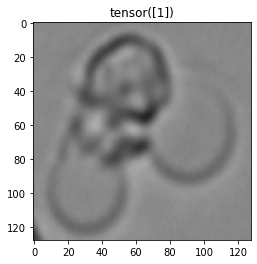

tensor([1])


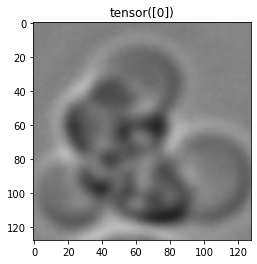

tensor([0])


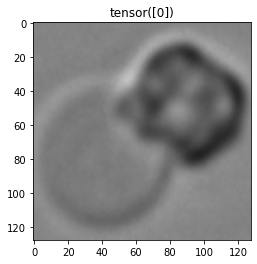

tensor([0])


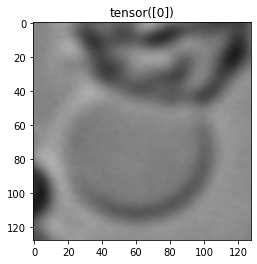

tensor([0])


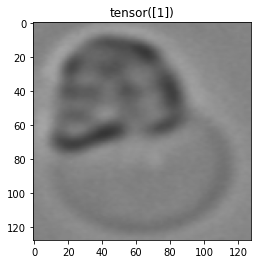

tensor([1])


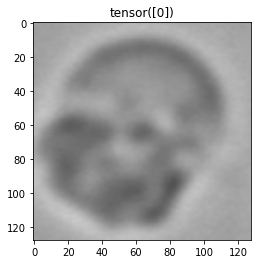

tensor([0])


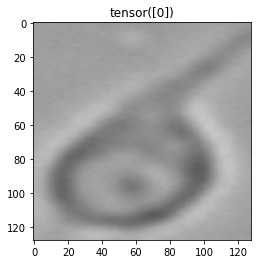

tensor([0])


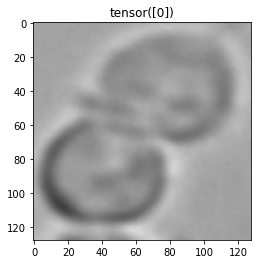

tensor([0])


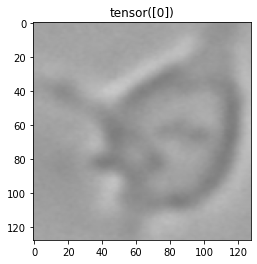

tensor([0])


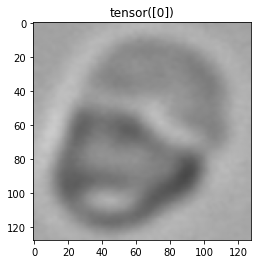

tensor([0])


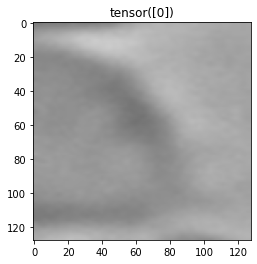

tensor([0])


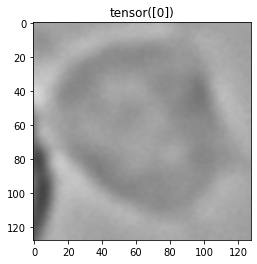

tensor([0])


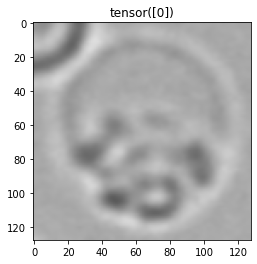

tensor([0])


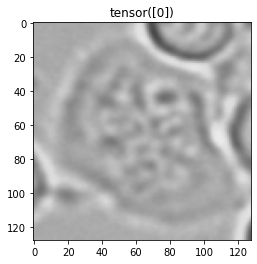

tensor([0])


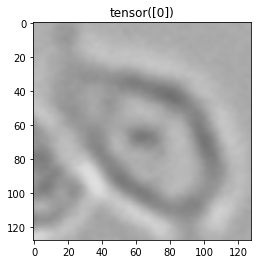

tensor([0])


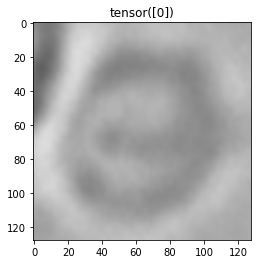

tensor([0])


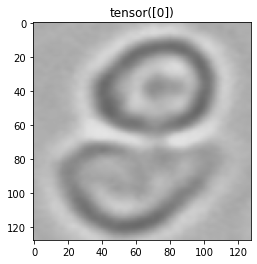

tensor([0])


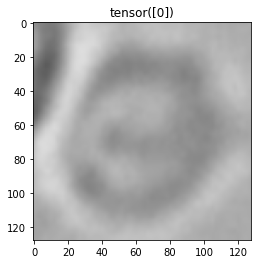

tensor([0])


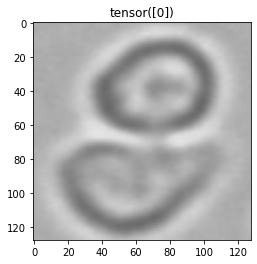

tensor([0])


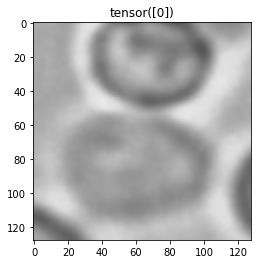

tensor([0])


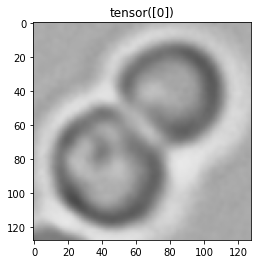

tensor([0])


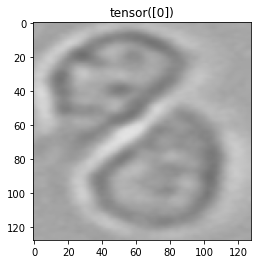

tensor([0])


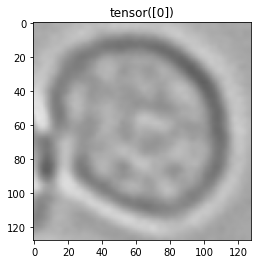

tensor([0])


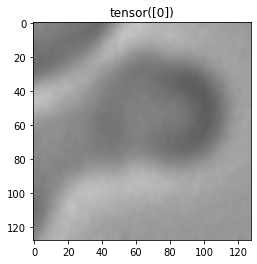

tensor([0])


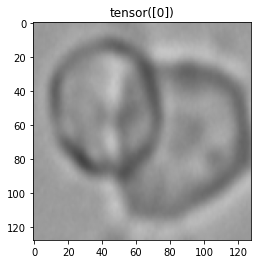

tensor([0])


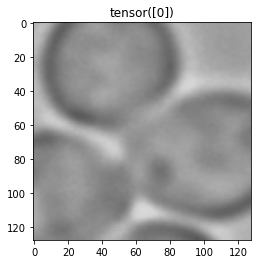

tensor([0])


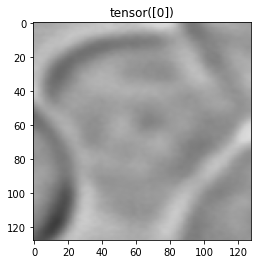

tensor([0])


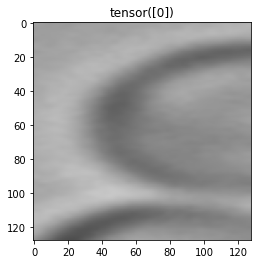

tensor([0])


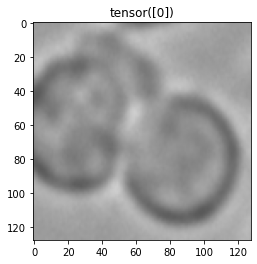

tensor([0])


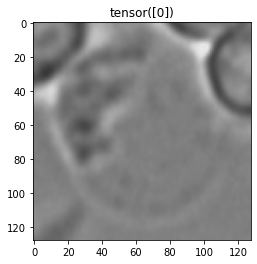

tensor([0])


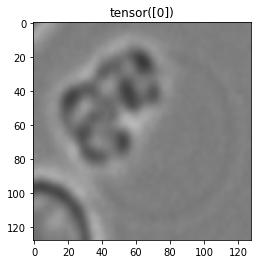

tensor([0])


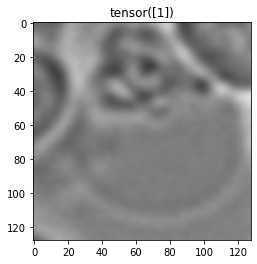

tensor([1])


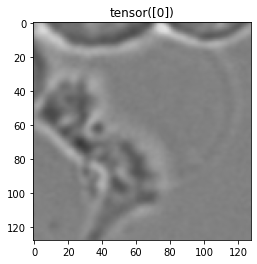

tensor([0])


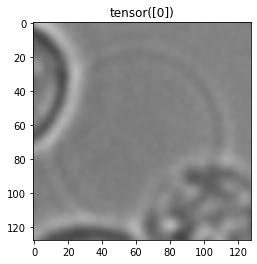

tensor([0])


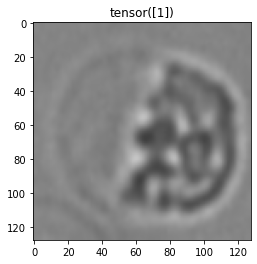

tensor([1])


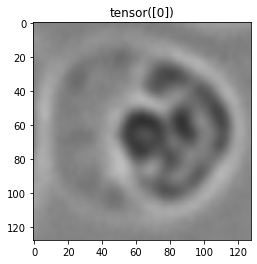

tensor([0])


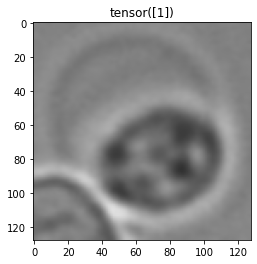

tensor([1])


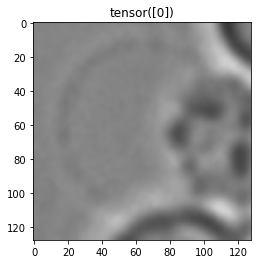

tensor([0])


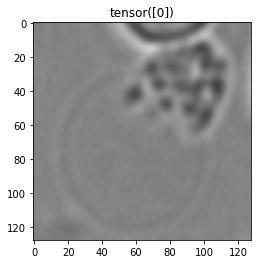

tensor([0])


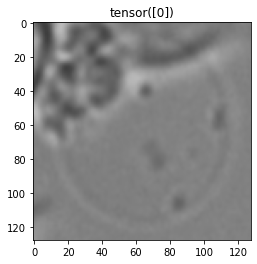

tensor([0])


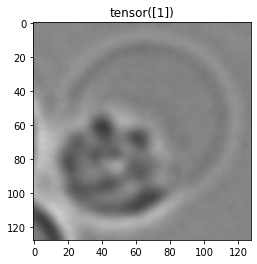

tensor([1])


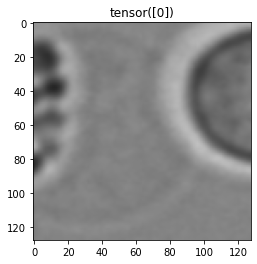

tensor([0])


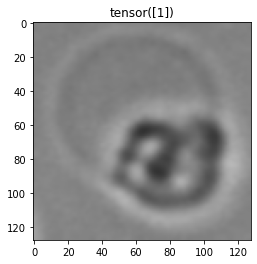

tensor([1])


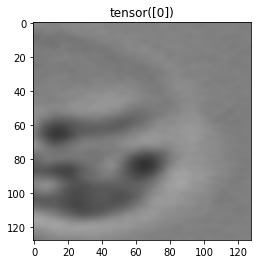

tensor([0])


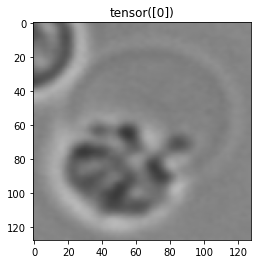

tensor([0])


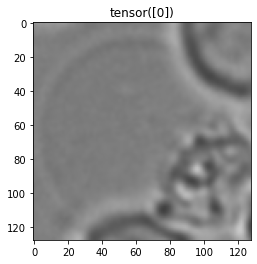

tensor([0])


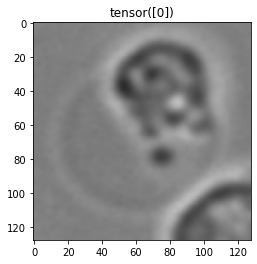

tensor([0])


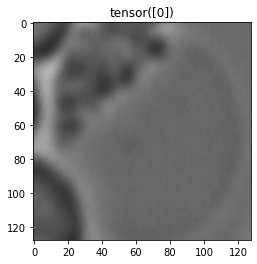

tensor([0])


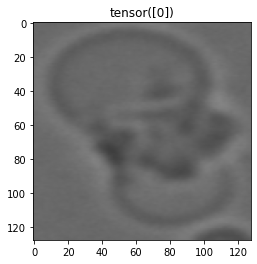

tensor([0])


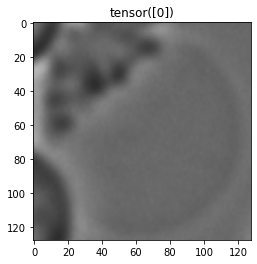

tensor([0])


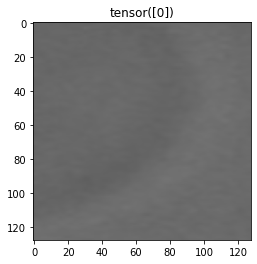

tensor([0])


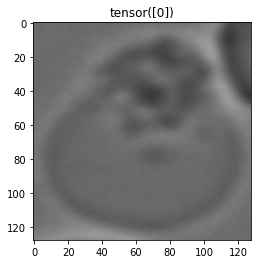

tensor([0])


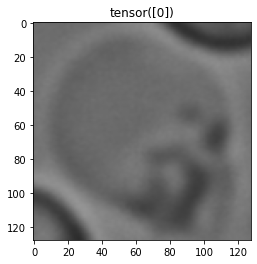

tensor([0])


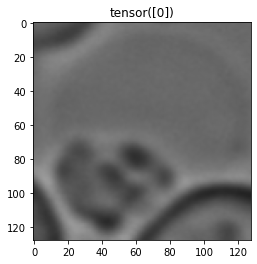

tensor([0])


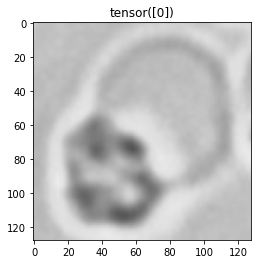

tensor([0])


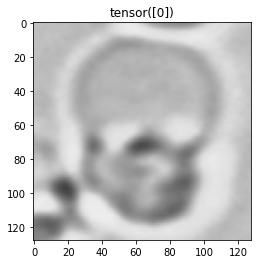

tensor([0])


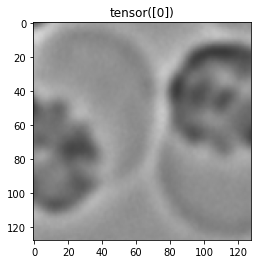

tensor([0])


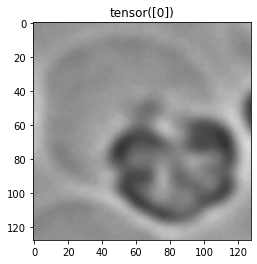

tensor([0])


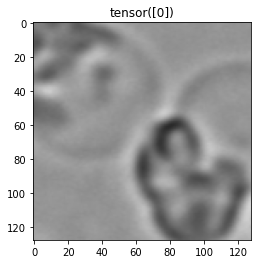

tensor([0])


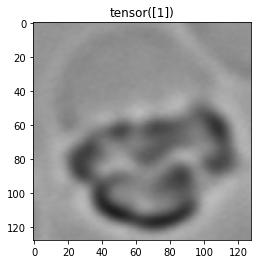

tensor([1])


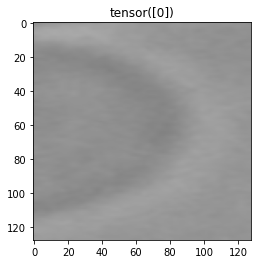

tensor([0])


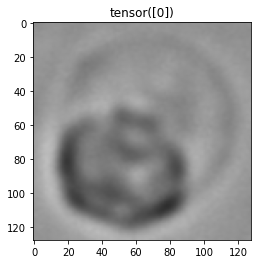

tensor([0])


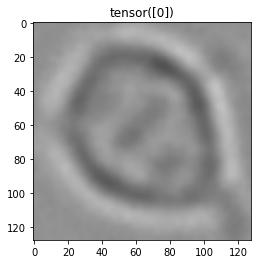

tensor([0])


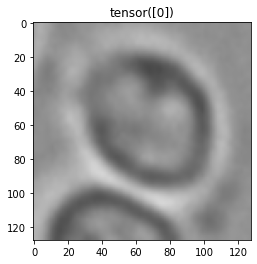

tensor([0])


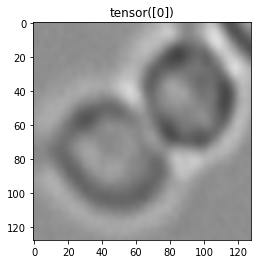

tensor([0])


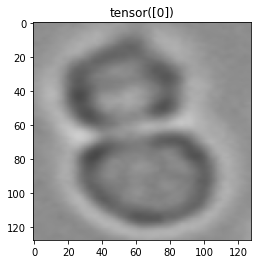

tensor([0])


In [5]:
model_cls = resnet34()
model_cls.load_state_dict(torch.load('F:/yolov5-master/model_cls/_saved/weight_202262/last.pt',map_location=torch.device('cpu')))


def letterbox( im, new_shape=(128,128), color=(114, 114, 114), auto=False, scaleFill=True, scaleup=True,
              stride=32):
    # Resize and pad image while meeting stride-multiple constraints
    shape = im.shape[:2]  # current shape [height, width]
    if isinstance(new_shape, int):
        new_shape = (new_shape, new_shape)

    # Scale ratio (new / old)
    r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])

    if not scaleup:  # only scale down, do not scale up (for better val mAP)
        r = min(r, 1.0)

    # Compute padding
    ratio = r, r  # width, height ratios
    new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
    dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
    if auto:  # minimum rectangle
        dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
    elif scaleFill:  # stretch
        dw, dh = 0.0, 0.0
        new_unpad = (new_shape[1], new_shape[0])
        ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

    dw /= 2  # divide padding into 2 sides
    dh /= 2

    if shape[::-1] != new_unpad:  # resize
        im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)

    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))

    im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border

    return im, ratio, (dw, dh)
path = 'F:/yolov5-master/runs/detect/exp2/crops/dead/'

for val in os.listdir(path):
    if val.endswith('jpg'):
        im = cv2.imread(path + val)
        im = torch.Tensor(im)

        h0, w0 = im.shape[:2]
        r = 128 / max(h0, w0)
        if r != 1:  # if sizes are not equal
            im = cv2.resize(np.array(im), (int(w0 * r), int(h0 * r)),
                            interpolation=cv2.INTER_LINEAR if (True or r > 1) else cv2.INTER_AREA)

        im, _, (_, _) = letterbox(im, new_shape=(128, 128))

        # self.augment_hsv(im)

        # if random.random() < 0.5:
        #     im = np.flipud(im)
        # if random.random() < 0.5:
        #     im = np.fliplr(im)

        im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        im = np.ascontiguousarray(im)
        im = torch.Tensor(im)
        im = im.unsqueeze(0)

        pred = model_cls(im)
        pred_cls = torch.max(pred, dim=1)[1]

        img = im.squeeze(0)
        img = img.transpose(0,1).transpose(1,2)

        plt.imshow(img/255)
        plt.title(str(pred_cls))
        plt.show()

        print(pred_cls)

